Run this in terminal: `conda install -c conda-forge pydotplus`

Run this in terminal: `conda install -c conda-forge tensorflow`

Run this in terminal: `conda install -c plotly plotly`

In [1]:
#Import all packages needed

import numpy as np # linear algebra
import pandas as pd # data processing
import os
import matplotlib.pyplot as plt # charts and graphs
import seaborn as sns # styling & pretty colors
import shutil
import tensorflow as tf
import plotly.express as px
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split


#For Linear Regression
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import xlrd

#For Polynomial regression
from sklearn.preprocessing import PolynomialFeatures 


#For Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

#for K-Means Clustering
from sklearn.datasets.samples_generator import make_blobs
from sklearn.cluster import KMeans

/Users/rosie.kipling/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: DeprecationWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).



In [2]:
#show lots of columns and rows in pandas
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 3000)
pd.set_option('display.width', 3000)

In [3]:
#Import dataset and unstack columns, then reset index

# dataset = pd.read_csv('./PGA_Data_Historical.csv')
# chunks = pd.read_csv('./pga-tour-20102018-data/PGA_Data_Historical.csv', chunksize=100000)
# dataset = pd.concat(chunks)
dataset = pd.read_csv('./pga-tour-20102018-data/PGA_Data_Historical.csv')
dataset.shape

(2740403, 5)

In [4]:
df = dataset.set_index(['Player Name', 'Variable', 'Season'])['Value'].unstack('Variable').reset_index()
df.shape

(11223, 2083)

In [5]:
print("original column count:\t" + str(len(dataset.columns)))
print("     new column count:\t" + str(len(df.columns)))

original column count:	5
     new column count:	2083


In [6]:
#Narrow down to the more interesting X columns.
Keep_Columns = ['Player Name','Season','Total Money (Official and Unofficial) - (MONEY)','3-Putts per Round - (AVG)',
                'Average Distance to Hole After Tee Shot - (AVG)','Scrambling from the Sand - (%)',
                'Scrambling from the Fringe - (%)','Scrambling from the Rough - (%)','Driving Accuracy Percentage - (%)',
                'Birdie or Better Conversion Percentage - (%)','Consecutive GIR - (STREAK)'
                ,'Driving Distance - (AVG.)','Greens in Regulation Percentage - (%)','Good Drive Percentage - (%)'
                ,'Lowest Round - (VALUE)','One-Putt Percentage - (%)','Putts Per Round - (AVG)',"Putting from - 10-15' - (% MADE)",
                "Putting from - 15-20' - (% MADE)","Putting from - 20-25' - (% MADE)","Putting from Inside 5' - (%)","Putting from 5-10' - (%)"
               ]
Keep_Columns

['Player Name',
 'Season',
 'Total Money (Official and Unofficial) - (MONEY)',
 '3-Putts per Round - (AVG)',
 'Average Distance to Hole After Tee Shot - (AVG)',
 'Scrambling from the Sand - (%)',
 'Scrambling from the Fringe - (%)',
 'Scrambling from the Rough - (%)',
 'Driving Accuracy Percentage - (%)',
 'Birdie or Better Conversion Percentage - (%)',
 'Consecutive GIR - (STREAK)',
 'Driving Distance - (AVG.)',
 'Greens in Regulation Percentage - (%)',
 'Good Drive Percentage - (%)',
 'Lowest Round - (VALUE)',
 'One-Putt Percentage - (%)',
 'Putts Per Round - (AVG)',
 "Putting from - 10-15' - (% MADE)",
 "Putting from - 15-20' - (% MADE)",
 "Putting from - 20-25' - (% MADE)",
 "Putting from Inside 5' - (%)",
 "Putting from 5-10' - (%)"]

In [7]:
#Drop non-numeric
df=df[Keep_Columns].dropna()
df=df[Keep_Columns]

In [8]:
df.apply(pd.to_numeric, errors='ignore');

In [9]:
#Rename the columns to something shorter
df.rename(columns = {'Total Money (Official and Unofficial) - (MONEY)':'Money'}, inplace = True)
df.rename(columns = {'3-Putts per Round - (AVG)':'ThreePuttAvg'}, inplace = True)
df.rename(columns = {'Average Distance to Hole After Tee Shot - (AVG)':'AverageDistance'}, inplace = True)
df.rename(columns = {'Scrambling from the Sand - (%)':'ScramblingSand'}, inplace = True)
df.rename(columns = {'Scrambling from the Fringe - (%)':'ScramblingFringe'}, inplace=True)
df.rename(columns = {'Scrambling from the Rough - (%)':'ScramblingRough'}, inplace=True)
df.rename(columns = {'Driving Accuracy Percentage - (%)':'DrivingAccuracy'}, inplace=True)
df.rename(columns = {'Birdie or Better Conversion Percentage - (%)':'BirdieConversion'}, inplace=True)
# df.rename(columns = {'World Golf Ranking Points - (POINTS)':'WorldRankingPoints'}, inplace=True)
df.rename(columns = {'Consecutive GIR - (STREAK)':'ConsecutiveGIR'}, inplace=True)
df.rename(columns = {'Driving Distance - (AVG.)':'Distance'}, inplace=True)
df.rename(columns = {'Greens in Regulation Percentage - (%)':'GIRpct'}, inplace=True)
df.rename(columns = {'Good Drive Percentage - (%)':'GoodDrivepct'}, inplace=True)
df.rename(columns = {'Hit Fairway Percentage - (%)':'HitFairwaypct'}, inplace=True)
df.rename(columns = {'Lowest Round - (VALUE)':'LowestRound'}, inplace=True)
df.rename(columns = {'One-Putt Percentage - (%)':'OnePuttpct'}, inplace=True)
df.rename(columns = {'Putts Per Round - (AVG)':'AvgPuttsPerRound'}, inplace=True)
df.rename(columns = {"Putting from Inside 5' - (%)":'Puttsmadeinside5ft'}, inplace=True)
df.rename(columns = {"Putting from 5-10' - (%)":'Puttsmade5to10ft'}, inplace=True)
df.rename(columns = {"Putting from - 10-15' - (% MADE)":'Puttsmade10to15ft'}, inplace=True)
df.rename(columns = {"Putting from - 15-20' - (% MADE)":'Puttsmade15to20ft'}, inplace=True)
df.rename(columns = {"Putting from - 20-25' - (% MADE)":'Puttsmade20to25ft'}, inplace=True)

In [10]:
df.columns

Index(['Player Name', 'Season', 'Money', 'ThreePuttAvg', 'AverageDistance', 'ScramblingSand', 'ScramblingFringe', 'ScramblingRough', 'DrivingAccuracy', 'BirdieConversion', 'ConsecutiveGIR', 'Distance', 'GIRpct', 'GoodDrivepct', 'LowestRound', 'OnePuttpct', 'AvgPuttsPerRound', 'Puttsmade10to15ft', 'Puttsmade15to20ft', 'Puttsmade20to25ft', 'Puttsmadeinside5ft', 'Puttsmade5to10ft'], dtype='object', name='Variable')

In [11]:
df.head()

Variable,Player Name,Season,Money,ThreePuttAvg,AverageDistance,ScramblingSand,ScramblingFringe,ScramblingRough,DrivingAccuracy,BirdieConversion,ConsecutiveGIR,Distance,GIRpct,GoodDrivepct,LowestRound,OnePuttpct,AvgPuttsPerRound,Puttsmade10to15ft,Puttsmade15to20ft,Puttsmade20to25ft,Puttsmadeinside5ft,Puttsmade5to10ft
1,Aaron Baddeley,2010,"879,317",.32,166.1,57.66,91.04,54.58,56.65,31.65,14,298.9,64.60,80.28,64,40.43,28.57,31.22,21.69,16.10,96.38,58.87
2,Aaron Baddeley,2011,"$3,157,193",.44,168.4,56.73,94.74,49.32,55.67,32.99,16,296.2,65.48,78.64,64,40.62,28.39,30.73,17.65,20.20,96.22,61.73
3,Aaron Baddeley,2012,"$1,215,753",.44,169.4,65.52,96.23,59.26,54.30,32.67,14,292.0,58.10,75.77,66,44.21,28.07,38.24,19.35,6.67,96.58,61.72
4,Aaron Baddeley,2013,"$721,024",.48,179.8,55.32,94.59,54.50,50.71,32.99,15,288.5,58.00,74.15,64,45.37,27.80,33.33,19.09,19.72,97.06,55.50
5,Aaron Baddeley,2014,"$942,559",.38,176.5,57.14,89.74,58.01,52.29,32.00,10,293.8,59.80,75.90,65,44.14,28.15,39.62,27.18,11.22,96.59,60.67


In [12]:
df.shape

(1678, 22)

In [13]:
#Remove $ and commas from Money
df['Money']= df['Money'].str.replace('$','')
df['Money']= df['Money'].str.replace(',','')

In [14]:
df.dtypes

Variable
Player Name           object
Season                 int64
Money                 object
ThreePuttAvg          object
AverageDistance       object
ScramblingSand        object
ScramblingFringe      object
ScramblingRough       object
DrivingAccuracy       object
BirdieConversion      object
ConsecutiveGIR        object
Distance              object
GIRpct                object
GoodDrivepct          object
LowestRound           object
OnePuttpct            object
AvgPuttsPerRound      object
Puttsmade10to15ft     object
Puttsmade15to20ft     object
Puttsmade20to25ft     object
Puttsmadeinside5ft    object
Puttsmade5to10ft      object
dtype: object

In [15]:
#Make all variables into numbers
for col in  df.columns[2:]:
   df[col] = df[col].astype(float)

In [16]:
df.dtypes

Variable
Player Name            object
Season                  int64
Money                 float64
ThreePuttAvg          float64
AverageDistance       float64
ScramblingSand        float64
ScramblingFringe      float64
ScramblingRough       float64
DrivingAccuracy       float64
BirdieConversion      float64
ConsecutiveGIR        float64
Distance              float64
GIRpct                float64
GoodDrivepct          float64
LowestRound           float64
OnePuttpct            float64
AvgPuttsPerRound      float64
Puttsmade10to15ft     float64
Puttsmade15to20ft     float64
Puttsmade20to25ft     float64
Puttsmadeinside5ft    float64
Puttsmade5to10ft      float64
dtype: object

In [17]:
player_df = df.groupby(['Player Name','Season']).mean().reset_index()

In [18]:
player_df.shape

(1678, 22)

In [19]:
# def label_WRP(row):
#    if row['WorldRankingPoints'] > 100 :
#       return True
#    return False

# player_df['WRP>100'] = player_df.apply (lambda row: label_WRP(row), axis=1)

## Visually inspecting the data

Looking at a single player's stats over time:

In [20]:
player_df[player_df['Player Name']=='Matt Kuchar']

Variable,Player Name,Season,Money,ThreePuttAvg,AverageDistance,ScramblingSand,ScramblingFringe,ScramblingRough,DrivingAccuracy,BirdieConversion,ConsecutiveGIR,Distance,GIRpct,GoodDrivepct,LowestRound,OnePuttpct,AvgPuttsPerRound,Puttsmade10to15ft,Puttsmade15to20ft,Puttsmade20to25ft,Puttsmadeinside5ft,Puttsmade5to10ft
1102,Matt Kuchar,2010,5180477.0,0.36,175.0,59.14,91.18,62.29,67.89,31.22,21.0,286.9,69.36,85.48,63.0,40.23,28.74,36.96,28.10,7.77,97.04,60.26
1103,Matt Kuchar,2011,5846420.0,0.32,174.8,61.54,86.67,64.00,64.75,31.86,26.0,286.2,66.98,83.55,63.0,41.16,28.52,26.77,22.30,10.87,97.89,58.42
1104,Matt Kuchar,2012,4035565.0,0.37,176.9,58.33,82.14,66.04,65.06,29.53,13.0,286.2,65.38,81.96,65.0,41.06,28.51,37.04,16.06,15.65,97.21,57.98
1105,Matt Kuchar,2013,5616808.0,0.33,175.8,72.09,95.45,56.29,58.93,30.65,15.0,284.9,65.84,83.05,61.0,41.06,28.64,32.97,14.29,16.36,97.76,55.79
1106,Matt Kuchar,2014,5685515.0,0.34,177.4,64.21,87.30,61.96,67.37,30.57,18.0,283.8,66.92,85.23,64.0,39.96,28.74,32.80,24.57,15.00,96.39,61.01
1107,Matt Kuchar,2015,3143337.0,0.47,174.3,67.82,88.33,60.87,63.23,32.20,24.0,288.5,66.55,83.85,63.0,42.61,28.39,31.20,15.94,15.96,98.41,56.13
1108,Matt Kuchar,2016,4170178.0,0.46,176.4,56.52,96.67,61.17,65.67,31.43,15.0,285.8,67.82,84.10,62.0,39.81,29.02,32.65,21.58,14.63,96.81,58.82
1109,Matt Kuchar,2017,4859156.0,0.48,177.2,64.77,86.21,69.04,65.36,28.77,14.0,285.1,66.60,79.11,64.0,38.29,28.70,34.41,17.45,11.11,97.63,57.36
1110,Matt Kuchar,2018,1926347.0,0.45,179.1,62.89,90.32,60.00,63.27,29.24,15.0,288.0,66.81,83.02,64.0,40.56,28.85,33.53,18.79,10.31,97.48,58.18


Looking at dataset mean & std across different variables:

In [21]:
player_df.describe()

Variable,Season,Money,ThreePuttAvg,AverageDistance,ScramblingSand,ScramblingFringe,ScramblingRough,DrivingAccuracy,BirdieConversion,ConsecutiveGIR,Distance,GIRpct,GoodDrivepct,LowestRound,OnePuttpct,AvgPuttsPerRound,Puttsmade10to15ft,Puttsmade15to20ft,Puttsmade20to25ft,Puttsmadeinside5ft,Puttsmade5to10ft
count,1678.000000,1.678000e+03,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000
mean,2014.004768,1.549725e+06,0.535584,174.517044,51.535584,88.943278,55.866901,61.440560,29.039714,17.556019,290.807688,65.661675,81.043492,63.929678,38.282610,29.163331,30.054023,18.539362,12.225369,96.450036,55.894702
std,2.608637,1.481636e+06,0.119462,6.522796,7.187582,4.912346,5.098827,5.058845,2.277644,4.449963,8.916631,2.745411,3.487009,1.372205,2.599407,0.518468,3.810032,3.677765,3.674381,0.925290,3.813022
min,2010.000000,2.465000e+04,0.220000,149.800000,23.810000,68.420000,37.500000,43.020000,21.880000,6.000000,266.400000,53.540000,66.170000,58.000000,28.360000,27.510000,17.570000,7.220000,0.000000,91.170000,41.270000
25%,2012.000000,5.751708e+05,0.450000,170.800000,46.827500,85.940000,52.670000,57.942500,27.570000,14.000000,284.900000,63.830000,79.132500,63.000000,36.630000,28.810000,27.502500,16.000000,9.840000,95.910000,53.492500
50%,2014.000000,1.080789e+06,0.530000,174.650000,51.560000,89.345000,55.920000,61.430000,29.060000,17.000000,290.550000,65.790000,81.540000,64.000000,38.390000,29.140000,30.020000,18.520000,11.960000,96.540000,56.035000
75%,2016.000000,1.954250e+06,0.610000,178.800000,56.510000,92.310000,59.207500,64.910000,30.477500,20.000000,296.400000,67.580000,83.420000,65.000000,40.127500,29.520000,32.680000,20.907500,14.610000,97.090000,58.430000
max,2018.000000,1.303046e+07,1.000000,192.100000,72.410000,100.000000,78.690000,76.880000,37.090000,40.000000,319.700000,73.520000,89.690000,69.000000,45.860000,31.000000,44.810000,32.860000,26.360000,98.920000,68.910000


## Variable correlation with Money

In [22]:
dependent_variable = 'Money'
independent_variables = df.columns.drop([dependent_variable, 'Player Name'])

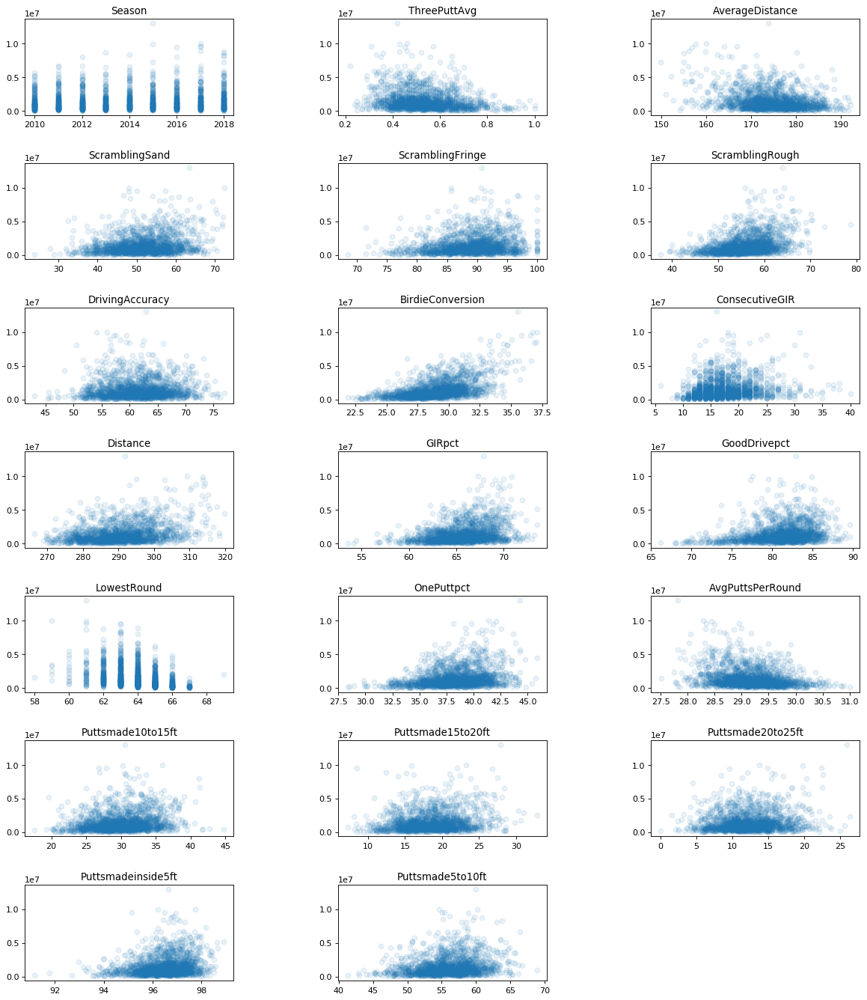

In [23]:
plt.figure(num=None, figsize=(18, 50), dpi=80, facecolor='w', edgecolor='k')

for idx, variable in enumerate(independent_variables):
    ax = plt.subplot(16, 3, idx+1)
    ax.set_title(variable)
    ax.scatter(df[variable].tolist(),df[dependent_variable].tolist(),alpha=0.1)
    
    plt.subplots_adjust(wspace=0.5, hspace=0.5)

## Variable correlations to each other

In [24]:
corr = player_df.corr()

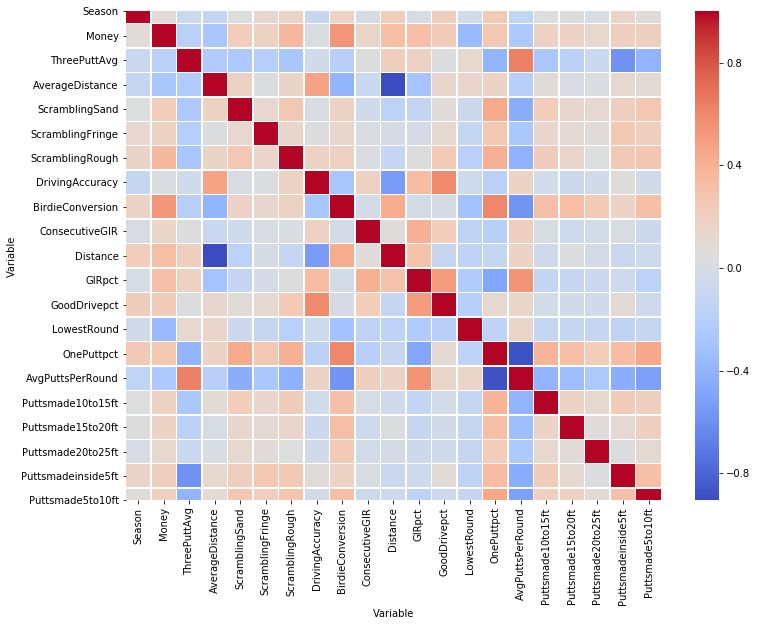

In [25]:
plt.figure(figsize=(12, 9))
svm = sns.heatmap(corr,cmap='coolwarm', linecolor='white', linewidths=0.5)

figure = svm.get_figure()    
figure.savefig('player_correlation.png', dpi=400, transparent=True)

### Looking at how variables interact with each other, and how players with above average earnings in a single season compare with the overall population

In [26]:
# sns.pairplot(player_df, height =  4)

In [27]:
money_mean = player_df['Money'].mean()
money_mean

1549725.0375446961

## Distance vs. Driving Accuracy

In [28]:
fig = px.scatter(player_df,x='Distance',y='DrivingAccuracy', 
                 color = 'Money',hover_data =['Player Name', 'Season'],
                 color_continuous_scale='Rainbow', range_x=(260,320), range_y=(45,80))

fig.update_layout(template="plotly_white")
fig.show()

In [29]:
fig = px.scatter(player_df[player_df['Money']>money_mean],x='Distance',y='DrivingAccuracy', 
                 color = 'Money',hover_data =['Player Name', 'Season'],
                 color_continuous_scale='Rainbow',range_x=(260,320), range_y=(45,80))

fig.update_layout(template="plotly_white")
fig.show()

## Distance to hole after teeshot vs. % Greens hit in regulation

In [30]:
fig = px.scatter(player_df,x='AverageDistance',y='GIRpct'
                 , color = 'Money',hover_data =['Player Name', 'Season']
                ,color_continuous_scale='Rainbow', range_x=(150,200), range_y=(55,75))

fig.update_layout(template="plotly_white")
fig.show()

In [31]:
fig = px.scatter(player_df[player_df['Money']>money_mean],x='AverageDistance',y='GIRpct'
                ,color = 'Money',hover_data =['Player Name', 'Season']
                ,color_continuous_scale='Rainbow', range_x=(150,200), range_y=(55,75))

fig.update_layout(template="plotly_white")
fig.show()

## Average Putts per Round vs. % Greens hit in regulation

In [32]:
fig = px.scatter(player_df,x='AvgPuttsPerRound',y='GIRpct', 
                 color = 'Money',hover_data =['Player Name','Season'], 
                 color_continuous_scale='Rainbow',range_x=(27,32), range_y=(55,75))

fig.update_layout(template="plotly_white")
fig.show()

In [33]:
fig = px.scatter(player_df[player_df['Money']>money_mean],x='AvgPuttsPerRound',y='GIRpct', 
                 color = 'Money',hover_data =['Player Name','Season'], 
                 color_continuous_scale='Rainbow',range_x=(27,32), range_y=(55,75))

fig.update_layout(template="plotly_white")
fig.show()

## % Pars made from hitting the rough vs. % of One Putts per Round

In [34]:
fig = px.scatter(player_df,x='ScramblingRough',y='OnePuttpct', 
                 color = 'Money',hover_data =['Player Name','Season'], 
                 color_continuous_scale='Rainbow', range_x=(35,80), range_y=(28,46))

fig.update_layout(template="plotly_white")
fig.show()

In [35]:
fig = px.scatter(player_df[player_df['Money']>money_mean],x='ScramblingRough',y='OnePuttpct', 
                 color = 'Money',hover_data =['Player Name','Season'], 
                 color_continuous_scale='Rainbow', range_x=(35,80), range_y=(28,46))

fig.update_layout(template="plotly_white")
fig.show()

# Linear Regression

## Splitting data into training & testing sets

In [36]:
training_data, testing_data = train_test_split(player_df, test_size = 0.2, random_state = 4)

## Defining Linear Regression Function

In [37]:
def linear_regression(X,y):
    
    model = LinearRegression()
    
    X_train = np.array(training_data[[X]])
    y_train = training_data[y]
    average_X_train =X_train.mean()

    model.fit(X_train,y_train)
    
    coefficients = model.coef_
    intercept = model.intercept_
    
    y_av_X = intercept + (coefficients[0]* average_X_train)
    
    y_model = model.predict(X_train)
    print()
    print('------------------')
    print('Training Data')
    print('------------------')
    print()
    
    print('intercept: ',round(intercept,2))
    print('coefficient: ',round(coefficients[0],2))
    print('linear equation: ',y,' = ',round(intercept,2),' + (',round(coefficients[0],2),' * ',X,' )')
    print('Average ',X,': ',round(average_X_train,2))
    print(y,' at average ',X,' = ',round(y_av_X,2))
    
    plt.scatter(X_train,y_train,alpha=0.3)
    plt.plot(X_train,y_model,'r',linewidth=0.5)
    plt.xlabel('')
    plt.ylabel('')
    plt.show()
    
    rmse = np.sqrt(mean_squared_error(y_train,y_model))
    r2 = r2_score(y_train,y_model)

    print('Root mean squared error - vs. Training Data: %f'% rmse)
    print('r^2 Score vs. Training Data: %f'% r2)
    
    print()
    print('------------------')
    print('Test Data')
    print('------------------')
    print()
    #Test on Testing Data
    y_test = testing_data[y]
    X_test = np.array(testing_data[X]).reshape(-1, 1)

    y_pred = model.predict(X_test)
    
    plt.scatter(X_test,y_test,alpha=0.3)
    plt.plot(X_test,y_pred,'r',linewidth=0.5)
    plt.xlabel('')
    plt.ylabel('')
    plt.show()
    
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    r2 = r2_score(y_test,y_pred)

    print('Root mean squared error - vs. Testing Data: %f'% rmse)
    print('r^2 Score vs. Testing Data: %f'% r2)
    
    return


------------------
Training Data
------------------

intercept:  20519177.74
coefficient:  -650815.7
linear equation:  Money  =  20519177.74  + ( -650815.7  *  AvgPuttsPerRound  )
Average  AvgPuttsPerRound :  29.15
Money  at average  AvgPuttsPerRound  =  1545140.58


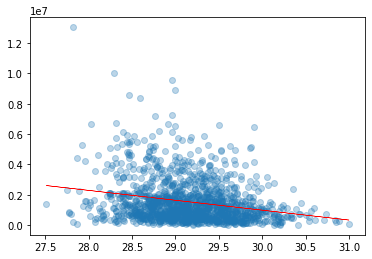

Root mean squared error - vs. Training Data: 1375842.056394
r^2 Score vs. Training Data: 0.057066

------------------
Test Data
------------------



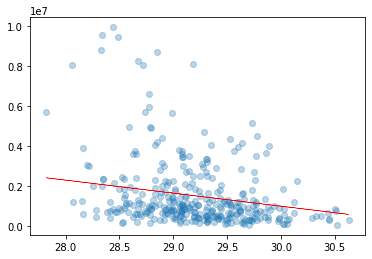

Root mean squared error - vs. Testing Data: 1643026.053383
r^2 Score vs. Testing Data: 0.081212


In [38]:
independent_variable = 'AvgPuttsPerRound'
dependent_variable = 'Money'

# X_train = np.array(training_data[[independent_variable]])
# X_train
# average_X_train = X_train.mean()
linear_regression(independent_variable,dependent_variable)

## Applying Linear Regression Model to all possible independent variables

----------------------------------
Season - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -104175975.08
coefficient:  52493.44
linear equation:  Money  =  -104175975.08  + ( 52493.44  *  Season  )
Average  Season :  2013.99
Money  at average  Season  =  1545140.58


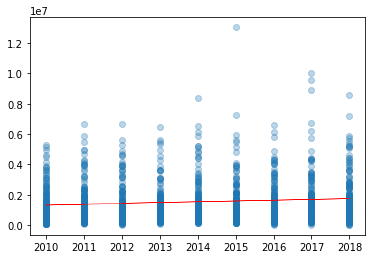

Root mean squared error - vs. Training Data: 1410194.930248
r^2 Score vs. Training Data: 0.009390

------------------
Test Data
------------------



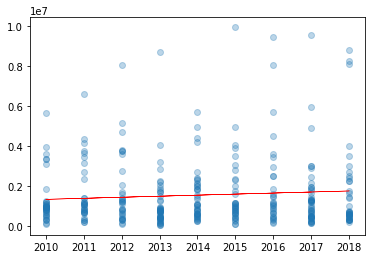

Root mean squared error - vs. Testing Data: 1711945.829933
r^2 Score vs. Testing Data: 0.002515


----------------------------------
ThreePuttAvg - Money
----------------------------------

------------------
Training Data
------------------

intercept:  2674169.85
coefficient:  -2109277.47
linear equation:  Money  =  2674169.85  + ( -2109277.47  *  ThreePuttAvg  )
Average  ThreePuttAvg :  0.54
Money  at average  ThreePuttAvg  =  1545140.58


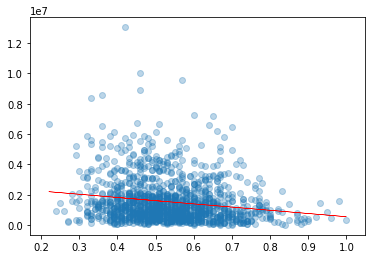

Root mean squared error - vs. Training Data: 1394500.322814
r^2 Score vs. Training Data: 0.031317

------------------
Test Data
------------------



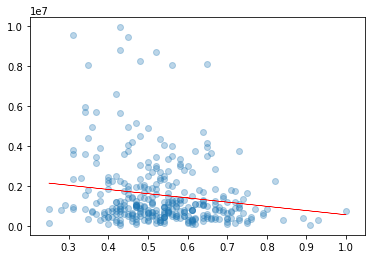

Root mean squared error - vs. Testing Data: 1673218.054915
r^2 Score vs. Testing Data: 0.047135


----------------------------------
AverageDistance - Money
----------------------------------

------------------
Training Data
------------------

intercept:  11329061.61
coefficient:  -56053.16
linear equation:  Money  =  11329061.61  + ( -56053.16  *  AverageDistance  )
Average  AverageDistance :  174.55
Money  at average  AverageDistance  =  1545140.58


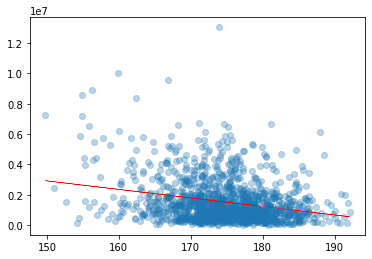

Root mean squared error - vs. Training Data: 1369329.742548
r^2 Score vs. Training Data: 0.065971

------------------
Test Data
------------------



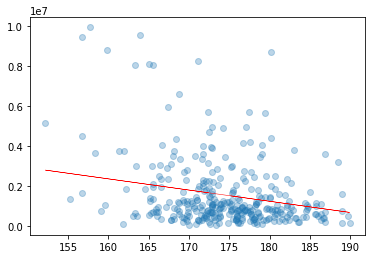

Root mean squared error - vs. Testing Data: 1632400.120777
r^2 Score vs. Testing Data: 0.093058


----------------------------------
ScramblingSand - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -812983.02
coefficient:  45725.76
linear equation:  Money  =  -812983.02  + ( 45725.76  *  ScramblingSand  )
Average  ScramblingSand :  51.57
Money  at average  ScramblingSand  =  1545140.58


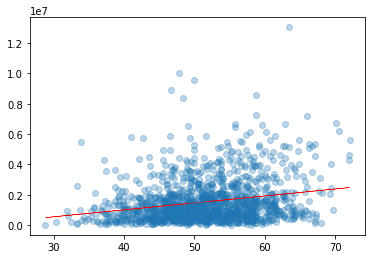

Root mean squared error - vs. Training Data: 1378796.220998
r^2 Score vs. Training Data: 0.053012

------------------
Test Data
------------------



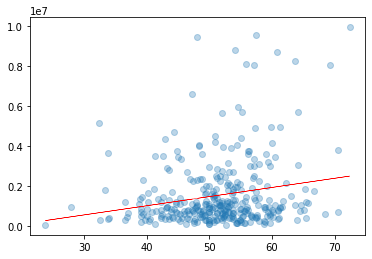

Root mean squared error - vs. Testing Data: 1680832.921350
r^2 Score vs. Testing Data: 0.038442


----------------------------------
ScramblingFringe - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -3123846.98
coefficient:  52460.14
linear equation:  Money  =  -3123846.98  + ( 52460.14  *  ScramblingFringe  )
Average  ScramblingFringe :  89.0
Money  at average  ScramblingFringe  =  1545140.58


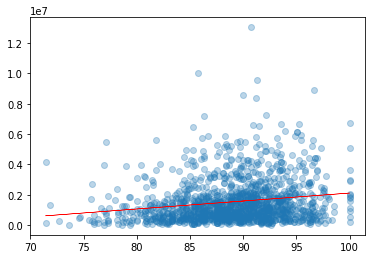

Root mean squared error - vs. Training Data: 1394065.223458
r^2 Score vs. Training Data: 0.031922

------------------
Test Data
------------------



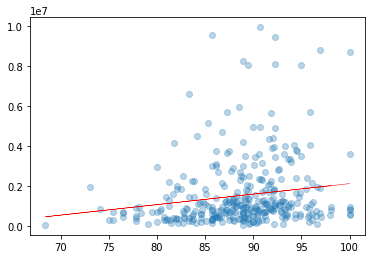

Root mean squared error - vs. Testing Data: 1682748.805693
r^2 Score vs. Testing Data: 0.036249


----------------------------------
ScramblingRough - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -4127473.31
coefficient:  101391.08
linear equation:  Money  =  -4127473.31  + ( 101391.08  *  ScramblingRough  )
Average  ScramblingRough :  55.95
Money  at average  ScramblingRough  =  1545140.58


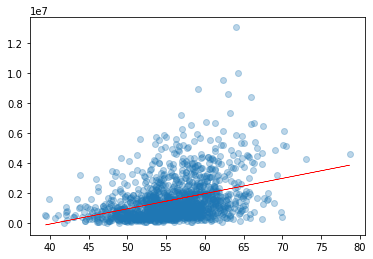

Root mean squared error - vs. Training Data: 1320210.005121
r^2 Score vs. Training Data: 0.131779

------------------
Test Data
------------------



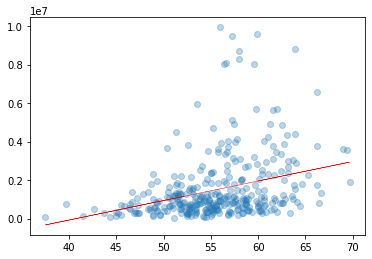

Root mean squared error - vs. Testing Data: 1616511.531305
r^2 Score vs. Testing Data: 0.110627


----------------------------------
DrivingAccuracy - Money
----------------------------------

------------------
Training Data
------------------

intercept:  806617.48
coefficient:  12034.3
linear equation:  Money  =  806617.48  + ( 12034.3  *  DrivingAccuracy  )
Average  DrivingAccuracy :  61.37
Money  at average  DrivingAccuracy  =  1545140.58


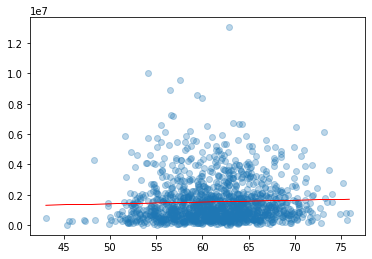

Root mean squared error - vs. Training Data: 1415604.088152
r^2 Score vs. Training Data: 0.001776

------------------
Test Data
------------------



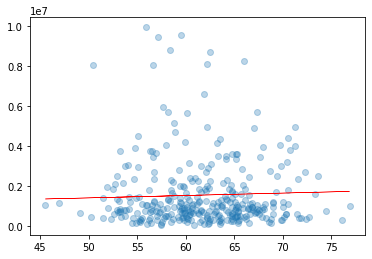

Root mean squared error - vs. Testing Data: 1718057.887958
r^2 Score vs. Testing Data: -0.004620


----------------------------------
BirdieConversion - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -8067334.9
coefficient:  330662.7
linear equation:  Money  =  -8067334.9  + ( 330662.7  *  BirdieConversion  )
Average  BirdieConversion :  29.07
Money  at average  BirdieConversion  =  1545140.58


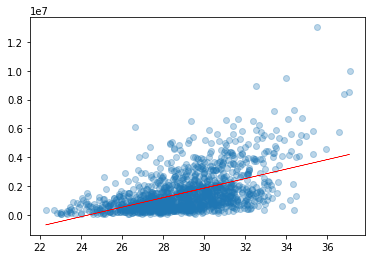

Root mean squared error - vs. Training Data: 1203791.231522
r^2 Score vs. Training Data: 0.278151

------------------
Test Data
------------------



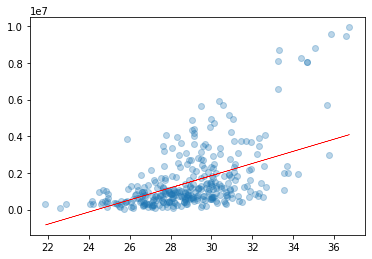

Root mean squared error - vs. Testing Data: 1408887.342498
r^2 Score vs. Testing Data: 0.324417


----------------------------------
ConsecutiveGIR - Money
----------------------------------

------------------
Training Data
------------------

intercept:  787125.49
coefficient:  43352.07
linear equation:  Money  =  787125.49  + ( 43352.07  *  ConsecutiveGIR  )
Average  ConsecutiveGIR :  17.49
Money  at average  ConsecutiveGIR  =  1545140.58


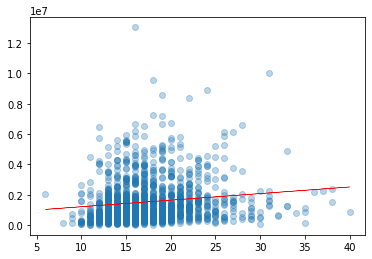

Root mean squared error - vs. Training Data: 1403485.341791
r^2 Score vs. Training Data: 0.018794

------------------
Test Data
------------------



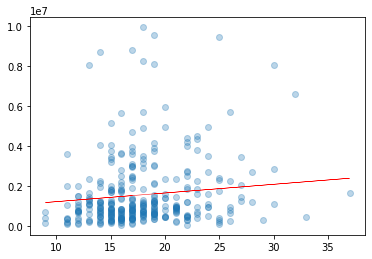

Root mean squared error - vs. Testing Data: 1690740.366504
r^2 Score vs. Testing Data: 0.027073


----------------------------------
Distance - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -12833018.2
coefficient:  49439.72
linear equation:  Money  =  -12833018.2  + ( 49439.72  *  Distance  )
Average  Distance :  290.82
Money  at average  Distance  =  1545140.58


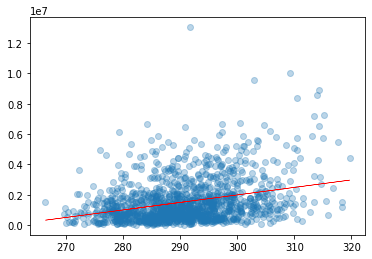

Root mean squared error - vs. Training Data: 1346594.198014
r^2 Score vs. Training Data: 0.096730

------------------
Test Data
------------------



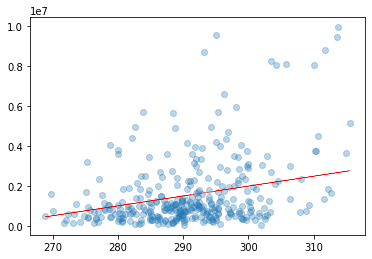

Root mean squared error - vs. Testing Data: 1604317.174531
r^2 Score vs. Testing Data: 0.123995


----------------------------------
GIRpct - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -8686253.97
coefficient:  155964.63
linear equation:  Money  =  -8686253.97  + ( 155964.63  *  GIRpct  )
Average  GIRpct :  65.6
Money  at average  GIRpct  =  1545140.58


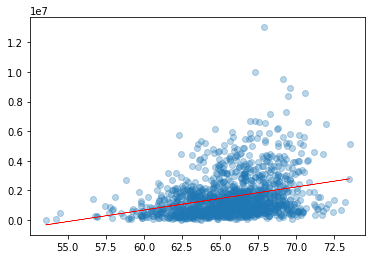

Root mean squared error - vs. Training Data: 1349721.432001
r^2 Score vs. Training Data: 0.092529

------------------
Test Data
------------------



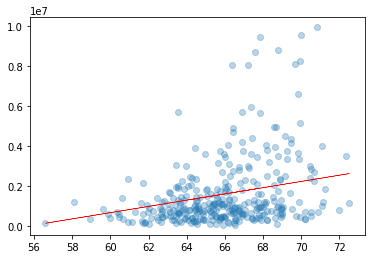

Root mean squared error - vs. Testing Data: 1619218.257306
r^2 Score vs. Testing Data: 0.107646


----------------------------------
GoodDrivepct - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -6562838.07
coefficient:  100104.35
linear equation:  Money  =  -6562838.07  + ( 100104.35  *  GoodDrivepct  )
Average  GoodDrivepct :  81.0
Money  at average  GoodDrivepct  =  1545140.58


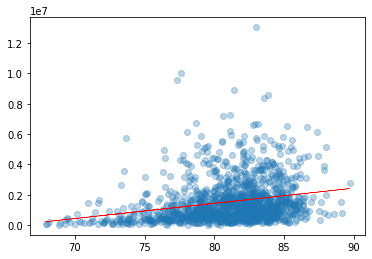

Root mean squared error - vs. Training Data: 1374700.236290
r^2 Score vs. Training Data: 0.058630

------------------
Test Data
------------------



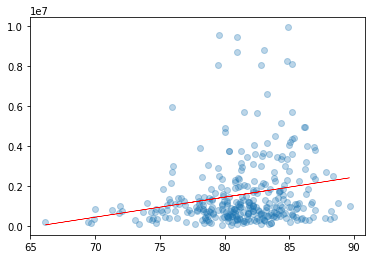

Root mean squared error - vs. Testing Data: 1678142.816874
r^2 Score vs. Testing Data: 0.041518


----------------------------------
LowestRound - Money
----------------------------------

------------------
Training Data
------------------

intercept:  25808697.34
coefficient:  -379414.05
linear equation:  Money  =  25808697.34  + ( -379414.05  *  LowestRound  )
Average  LowestRound :  63.95
Money  at average  LowestRound  =  1545140.58


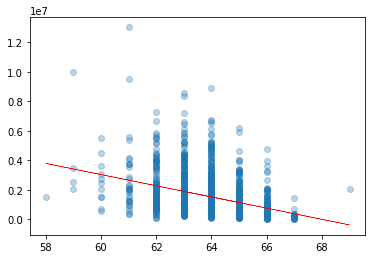

Root mean squared error - vs. Training Data: 1319581.818073
r^2 Score vs. Training Data: 0.132605

------------------
Test Data
------------------



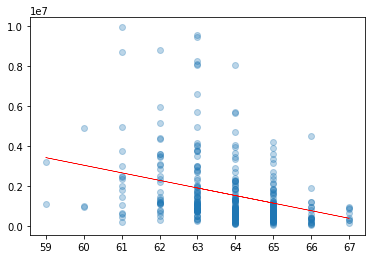

Root mean squared error - vs. Testing Data: 1604031.351253
r^2 Score vs. Testing Data: 0.124307


----------------------------------
OnePuttpct - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -3806510.28
coefficient:  139629.49
linear equation:  Money  =  -3806510.28  + ( 139629.49  *  OnePuttpct  )
Average  OnePuttpct :  38.33
Money  at average  OnePuttpct  =  1545140.58


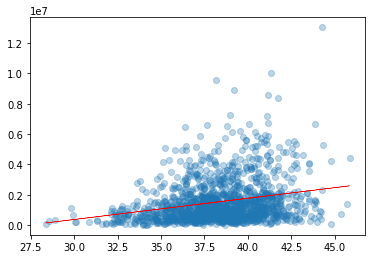

Root mean squared error - vs. Training Data: 1368897.721209
r^2 Score vs. Training Data: 0.066560

------------------
Test Data
------------------



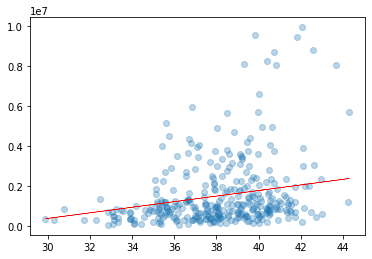

Root mean squared error - vs. Testing Data: 1646689.948709
r^2 Score vs. Testing Data: 0.077110


----------------------------------
AvgPuttsPerRound - Money
----------------------------------

------------------
Training Data
------------------

intercept:  20519177.74
coefficient:  -650815.7
linear equation:  Money  =  20519177.74  + ( -650815.7  *  AvgPuttsPerRound  )
Average  AvgPuttsPerRound :  29.15
Money  at average  AvgPuttsPerRound  =  1545140.58


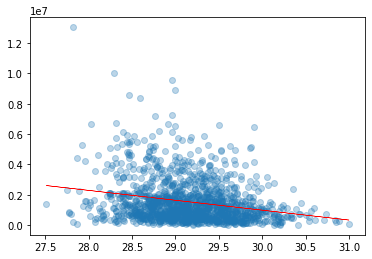

Root mean squared error - vs. Training Data: 1375842.056394
r^2 Score vs. Training Data: 0.057066

------------------
Test Data
------------------



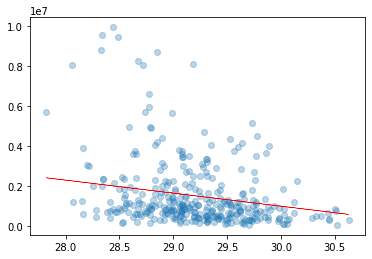

Root mean squared error - vs. Testing Data: 1643026.053383
r^2 Score vs. Testing Data: 0.081212


----------------------------------
Puttsmade10to15ft - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -405520.88
coefficient:  64778.03
linear equation:  Money  =  -405520.88  + ( 64778.03  *  Puttsmade10to15ft  )
Average  Puttsmade10to15ft :  30.11
Money  at average  Puttsmade10to15ft  =  1545140.58


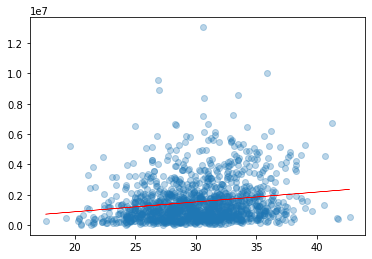

Root mean squared error - vs. Training Data: 1395483.042134
r^2 Score vs. Training Data: 0.029952

------------------
Test Data
------------------



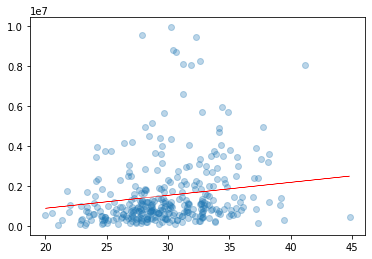

Root mean squared error - vs. Testing Data: 1673148.593656
r^2 Score vs. Testing Data: 0.047214


----------------------------------
Puttsmade15to20ft - Money
----------------------------------

------------------
Training Data
------------------

intercept:  333433.27
coefficient:  65139.21
linear equation:  Money  =  333433.27  + ( 65139.21  *  Puttsmade15to20ft  )
Average  Puttsmade15to20ft :  18.6
Money  at average  Puttsmade15to20ft  =  1545140.58


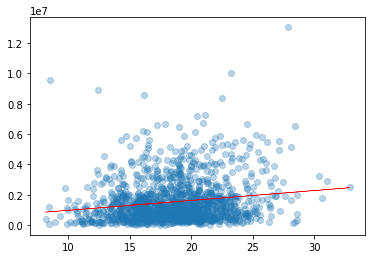

Root mean squared error - vs. Training Data: 1397050.365232
r^2 Score vs. Training Data: 0.027771

------------------
Test Data
------------------



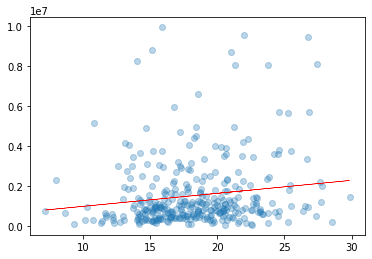

Root mean squared error - vs. Testing Data: 1689924.857066
r^2 Score vs. Testing Data: 0.028011


----------------------------------
Puttsmade20to25ft - Money
----------------------------------

------------------
Training Data
------------------

intercept:  1079469.13
coefficient:  38158.91
linear equation:  Money  =  1079469.13  + ( 38158.91  *  Puttsmade20to25ft  )
Average  Puttsmade20to25ft :  12.2
Money  at average  Puttsmade20to25ft  =  1545140.58


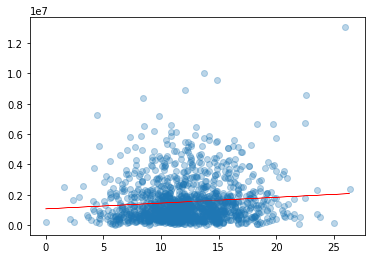

Root mean squared error - vs. Training Data: 1410049.689254
r^2 Score vs. Training Data: 0.009594

------------------
Test Data
------------------



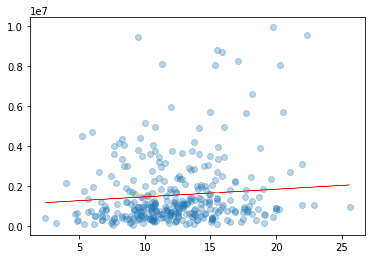

Root mean squared error - vs. Testing Data: 1692664.966304
r^2 Score vs. Testing Data: 0.024857


----------------------------------
Puttsmadeinside5ft - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -29933149.17
coefficient:  326372.55
linear equation:  Money  =  -29933149.17  + ( 326372.55  *  Puttsmadeinside5ft  )
Average  Puttsmadeinside5ft :  96.45
Money  at average  Puttsmadeinside5ft  =  1545140.58


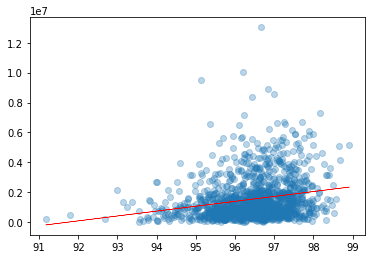

Root mean squared error - vs. Training Data: 1383466.156602
r^2 Score vs. Training Data: 0.046586

------------------
Test Data
------------------



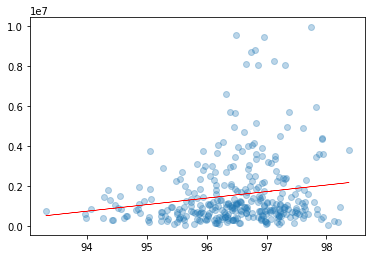

Root mean squared error - vs. Testing Data: 1682749.625267
r^2 Score vs. Testing Data: 0.036248


----------------------------------
Puttsmade5to10ft - Money
----------------------------------

------------------
Training Data
------------------

intercept:  -2599772.37
coefficient:  74116.79
linear equation:  Money  =  -2599772.37  + ( 74116.79  *  Puttsmade5to10ft  )
Average  Puttsmade5to10ft :  55.92
Money  at average  Puttsmade5to10ft  =  1545140.58


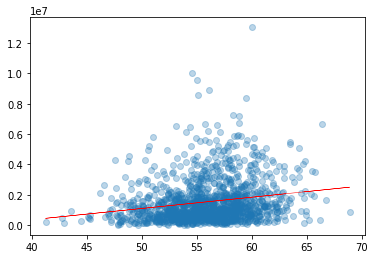

Root mean squared error - vs. Training Data: 1388830.039562
r^2 Score vs. Training Data: 0.039179

------------------
Test Data
------------------



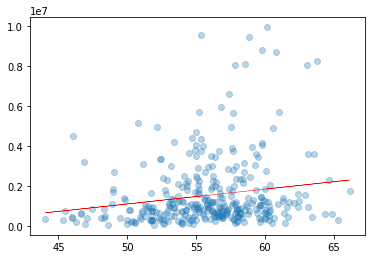

Root mean squared error - vs. Testing Data: 1680562.962186
r^2 Score vs. Testing Data: 0.038751




In [39]:
dependent_variable = 'Money'
independent_variables = player_df.columns.drop([dependent_variable, 
                                         'Player Name'
                                         ])

for i in range(0,len(independent_variables)) :

    print('----------------------------------')
    print(independent_variables[i],"-",dependent_variable)
    print('----------------------------------')

    linear_regression(independent_variables[i],dependent_variable)
    
    print()
    print()

# Multivariate Linear Regression

In [40]:
training_data, testing_data = train_test_split(player_df, test_size = 0.2, random_state = 4)

## Defining Multivariate Linear Regression Function

In [41]:
def multi_linear_regression(X,y):
    
    model_multi = LinearRegression()
    
    X_train = np.array(training_data[X]) 
    y_train = training_data[y]
    X_test = np.array(testing_data[X])
    y_test = testing_data[y]

    model_multi.fit(X_train,y_train)
    
    coefficients = model_multi.coef_
    intercept = model_multi.intercept_
    
    print('intercept: ',intercept)
    print('coefficients: ',coefficients)
    print()
    for i in range(0,len(coefficients)):
               print(independent_variables[i],': ', round(coefficients[i],2))
    print()

    y_pred = model_multi.predict(X_train)
    
    rmse = np.sqrt(mean_squared_error(y_train,y_pred))
    r2 = r2_score(y_train,y_pred)

    print('Root mean squared error - vs. Training Data: %f'% rmse)
    print('r^2 Score vs. Training Data: %f'% r2)
    print()
    
    y_pred = model_multi.predict(X_test)
    
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    r2 = r2_score(y_test,y_pred)

    print('Root mean squared error - vs. Testing Data: %f'% rmse)
    print('r^2 Score vs. Testing Data: %f'% r2)
    
    return X_test, y_test, X_train, y_train, y_pred

## Applying Multivariate Linear Regression

----------------------------------
Money  - Multivariate Linear Regression
----------------------------------

intercept:  55604180.70938616
coefficients:  [-4.72103716e+04 -6.82876073e+05  2.80272937e+04  2.91132476e+04
  2.41946953e+04  6.61938886e+04  2.41302210e+04  2.72668800e+05
  6.76854710e+03  4.90320205e+04  7.34086566e+04  2.10756485e+04
 -1.05656847e+05 -5.33779912e+04  3.81954362e+04 -4.82365194e+03
  1.25681301e+02 -2.44624155e+03  7.16168908e+04 -3.86678419e+03]

Season :  -47210.37
ThreePuttAvg :  -682876.07
AverageDistance :  28027.29
ScramblingSand :  29113.25
ScramblingFringe :  24194.7
ScramblingRough :  66193.89
DrivingAccuracy :  24130.22
BirdieConversion :  272668.8
ConsecutiveGIR :  6768.55
Distance :  49032.02
GIRpct :  73408.66
GoodDrivepct :  21075.65
LowestRound :  -105656.85
OnePuttpct :  -53377.99
AvgPuttsPerRound :  38195.44
Puttsmade10to15ft :  -4823.65
Puttsmade15to20ft :  125.68
Puttsmade20to25ft :  -2446.24
Puttsmadeinside5ft :  71616.89
Puttsmade5to1

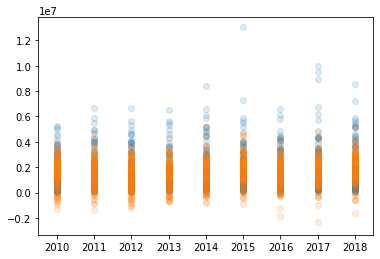

----------------------------------
ThreePuttAvg - Money
----------------------------------



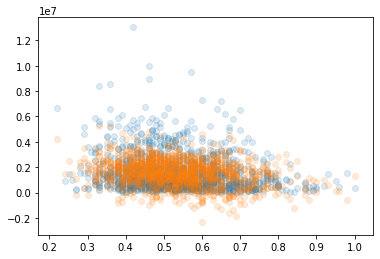

----------------------------------
AverageDistance - Money
----------------------------------



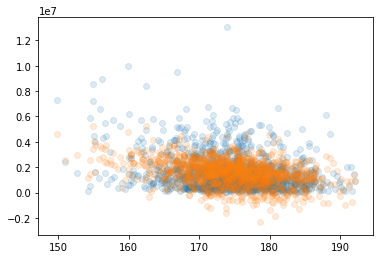

----------------------------------
ScramblingSand - Money
----------------------------------



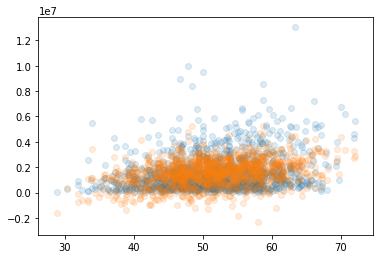

----------------------------------
ScramblingFringe - Money
----------------------------------



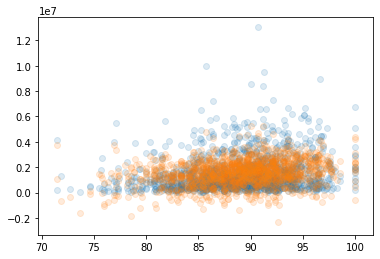

----------------------------------
ScramblingRough - Money
----------------------------------



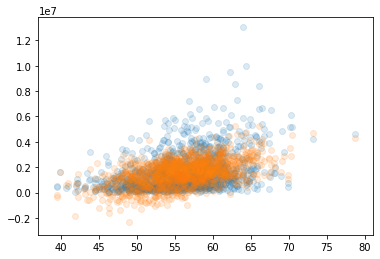

----------------------------------
DrivingAccuracy - Money
----------------------------------



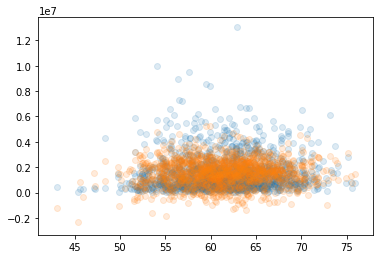

----------------------------------
BirdieConversion - Money
----------------------------------



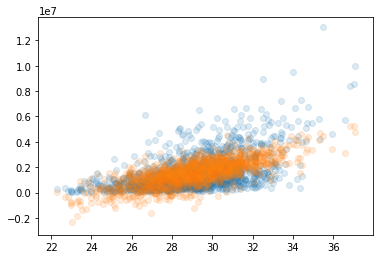

----------------------------------
ConsecutiveGIR - Money
----------------------------------



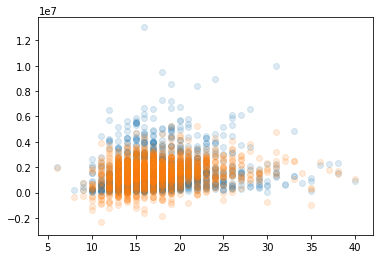

----------------------------------
Distance - Money
----------------------------------



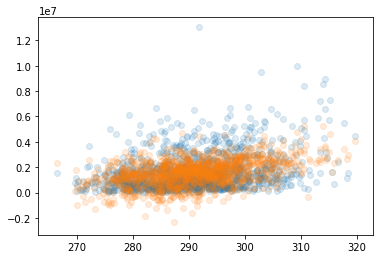

----------------------------------
GIRpct - Money
----------------------------------



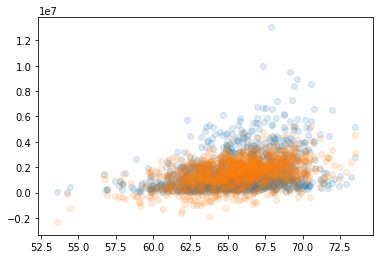

----------------------------------
GoodDrivepct - Money
----------------------------------



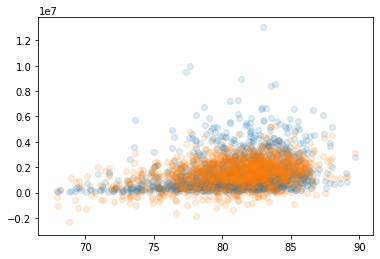

----------------------------------
LowestRound - Money
----------------------------------



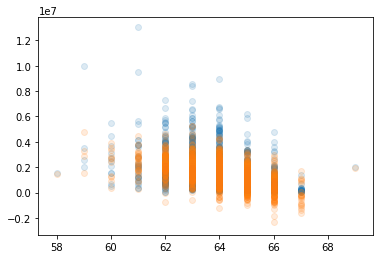

----------------------------------
OnePuttpct - Money
----------------------------------



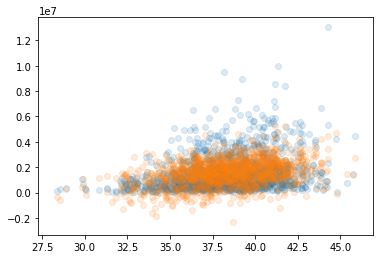

----------------------------------
AvgPuttsPerRound - Money
----------------------------------



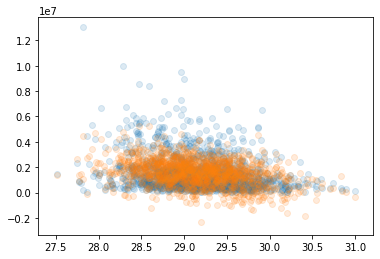

----------------------------------
Puttsmade10to15ft - Money
----------------------------------



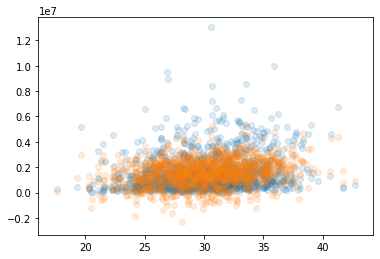

----------------------------------
Puttsmade15to20ft - Money
----------------------------------



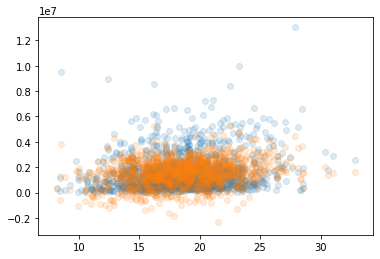

----------------------------------
Puttsmade20to25ft - Money
----------------------------------



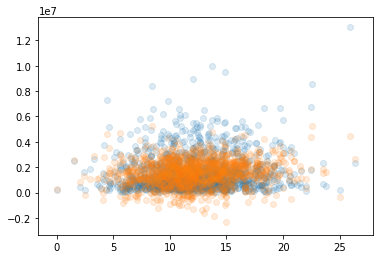

----------------------------------
Puttsmadeinside5ft - Money
----------------------------------



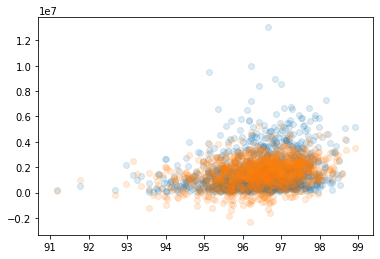

----------------------------------
Puttsmade5to10ft - Money
----------------------------------



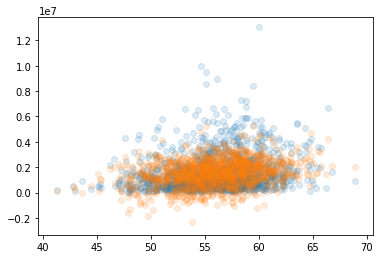

In [42]:
dependent_variable = 'Money'
independent_variables = player_df.columns.drop([dependent_variable,
                                                'Player Name'])

print('----------------------------------')
print(dependent_variable,' - Multivariate Linear Regression')
print('----------------------------------')
print()
multi_linear_regression(independent_variables,dependent_variable)
print()

model_multi = LinearRegression()

X_train = np.array(training_data[independent_variables]) 
y_train = training_data[dependent_variable]
X_test = np.array(testing_data[independent_variables])
y_test = testing_data[dependent_variable]

model_multi.fit(X_train,y_train)

y_pred = model_multi.predict(X_train)
    
for i in range(0,len(independent_variables)) :

    print('----------------------------------')
    print(independent_variables[i],"-",dependent_variable)
    print('----------------------------------')
    print()
    plt.scatter(X_train[:,i],y_train, alpha = 0.15)
    plt.scatter(X_train[:,i],y_pred,alpha = 0.15)
    plt.show()
    

# Polynomial Regression

## Defining Polynomial Regression Function

In [43]:
def polynomial_regression(X,y):
    
    training_data_sorted = training_data.sort_values(X)
    testing_data_sorted = testing_data.sort_values(X)

    X_train = np.array(training_data_sorted[[X]])
    y_train = training_data_sorted[y]
    X_test = np.array(testing_data_sorted[[X]])
    y_test = testing_data_sorted[y]

    poly = PolynomialFeatures(degree=2)
    X_poly = poly.fit_transform(X_train)
    
    model = LinearRegression()
    model.fit(X_poly, y_train)
    
    y_pred = model.predict(X_poly)
    
    print()
    print('------------------')
    print('Training Data')
    print('------------------')
    print()

    plt.scatter(X_train,y_train,alpha=0.3)
    plt.plot(X_train,y_pred,'r',linewidth=0.5)
    plt.xlabel('')
    plt.ylabel('')
    plt.show()

    rmse = np.sqrt(mean_squared_error(y_train,y_pred))
    r2 = r2_score(y_train,y_pred)

    print('Root mean squared error - vs. Training Data: %f'% rmse)
    print('r^2 Score vs. Training Data: %f'% r2)
    print()
    
    print()
    print('------------------')
    print('Test Data')
    print('------------------')
    print()
    
    X_poly_test = poly.fit_transform(X_test)
    y_pred_test = model.predict(X_poly_test)
    
    y_pred = model.predict(X_poly_test)
    
    plt.scatter(X_test,y_test,alpha=0.3)
    plt.plot(X_test,y_pred,'r',linewidth=0.5)
    plt.xlabel('')
    plt.ylabel('')
    plt.show()
    
    rmse = np.sqrt(mean_squared_error(y_test,y_pred_test))
    r2 = r2_score(y_test,y_pred_test)

    print('Root mean squared error - vs. Testing Data: %f'% rmse)
    print('r^2 Score vs. Testing Data: %f'% r2)
    return  X_test, y_test, X_train, y_train, y_pred


------------------
Training Data
------------------



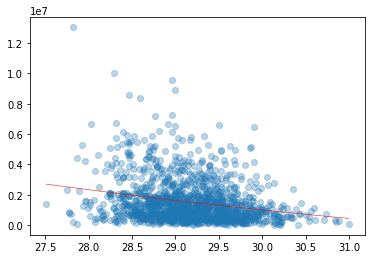

Root mean squared error - vs. Training Data: 1375769.286415
r^2 Score vs. Training Data: 0.057165


------------------
Test Data
------------------



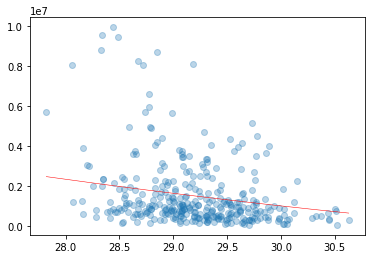

Root mean squared error - vs. Testing Data: 1642090.704641
r^2 Score vs. Testing Data: 0.082258


In [44]:
independent_variable = 'AvgPuttsPerRound'
dependent_variable = 'Money'

polynomial_regression(independent_variable,dependent_variable);

## Applying Polynomial Regression Model to all possible independent variables

----------------------------------
Season - Money
----------------------------------


------------------
Training Data
------------------



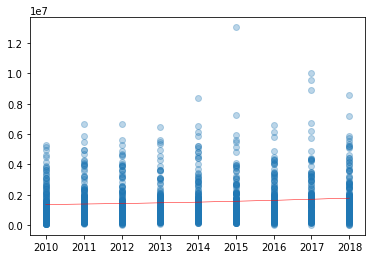

Root mean squared error - vs. Training Data: 1410059.767796
r^2 Score vs. Training Data: 0.009580


------------------
Test Data
------------------



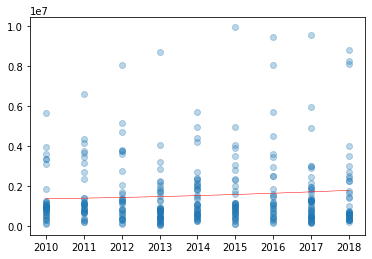

Root mean squared error - vs. Testing Data: 1712064.823840
r^2 Score vs. Testing Data: 0.002376
----------------------------------
ThreePuttAvg - Money
----------------------------------


------------------
Training Data
------------------



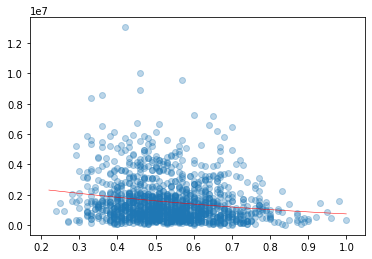

Root mean squared error - vs. Training Data: 1394328.860501
r^2 Score vs. Training Data: 0.031556


------------------
Test Data
------------------



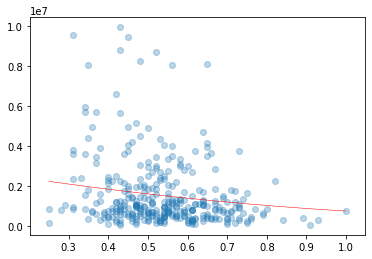

Root mean squared error - vs. Testing Data: 1672587.391471
r^2 Score vs. Testing Data: 0.047853
----------------------------------
AverageDistance - Money
----------------------------------


------------------
Training Data
------------------



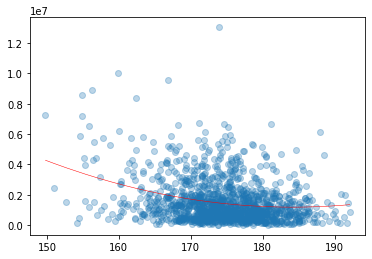

Root mean squared error - vs. Training Data: 1358712.094391
r^2 Score vs. Training Data: 0.080400


------------------
Test Data
------------------



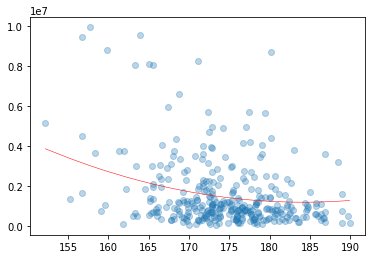

Root mean squared error - vs. Testing Data: 1608541.530489
r^2 Score vs. Testing Data: 0.119375
----------------------------------
ScramblingSand - Money
----------------------------------


------------------
Training Data
------------------



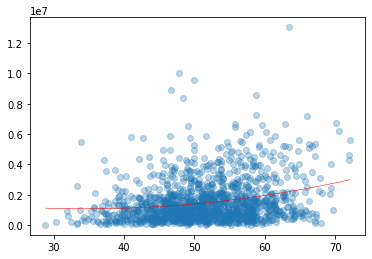

Root mean squared error - vs. Training Data: 1375618.732877
r^2 Score vs. Training Data: 0.057372


------------------
Test Data
------------------



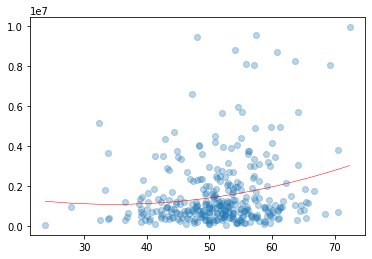

Root mean squared error - vs. Testing Data: 1670407.085447
r^2 Score vs. Testing Data: 0.050334
----------------------------------
ScramblingFringe - Money
----------------------------------


------------------
Training Data
------------------



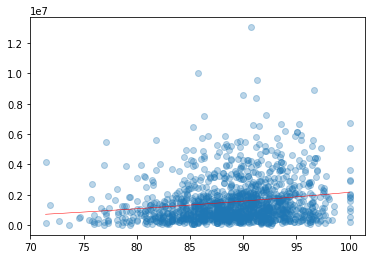

Root mean squared error - vs. Training Data: 1393996.874666
r^2 Score vs. Training Data: 0.032017


------------------
Test Data
------------------



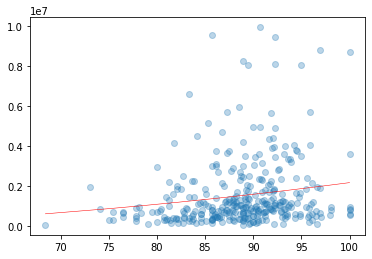

Root mean squared error - vs. Testing Data: 1683434.132549
r^2 Score vs. Testing Data: 0.035464
----------------------------------
ScramblingRough - Money
----------------------------------


------------------
Training Data
------------------



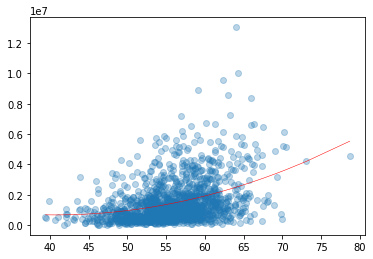

Root mean squared error - vs. Training Data: 1313315.561417
r^2 Score vs. Training Data: 0.140823


------------------
Test Data
------------------



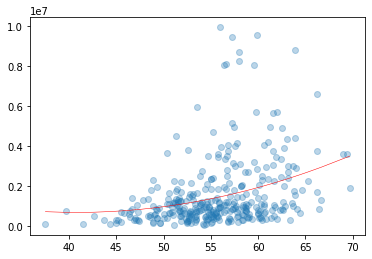

Root mean squared error - vs. Testing Data: 1620929.250867
r^2 Score vs. Testing Data: 0.105759
----------------------------------
DrivingAccuracy - Money
----------------------------------


------------------
Training Data
------------------



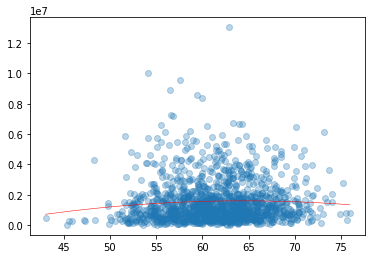

Root mean squared error - vs. Training Data: 1414065.183519
r^2 Score vs. Training Data: 0.003945


------------------
Test Data
------------------



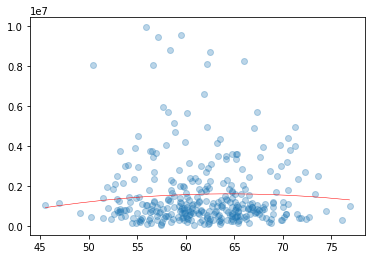

Root mean squared error - vs. Testing Data: 1718251.498729
r^2 Score vs. Testing Data: -0.004847
----------------------------------
BirdieConversion - Money
----------------------------------


------------------
Training Data
------------------



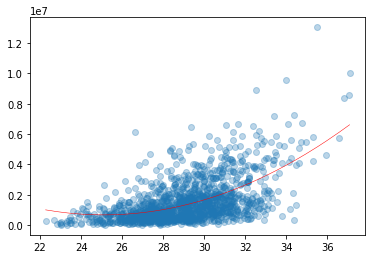

Root mean squared error - vs. Training Data: 1161501.840257
r^2 Score vs. Training Data: 0.327977


------------------
Test Data
------------------



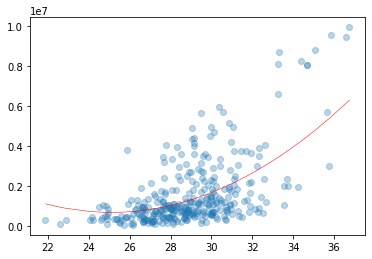

Root mean squared error - vs. Testing Data: 1307253.161379
r^2 Score vs. Testing Data: 0.418371
----------------------------------
ConsecutiveGIR - Money
----------------------------------


------------------
Training Data
------------------



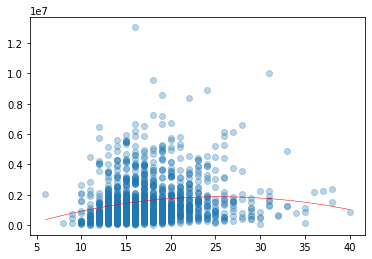

Root mean squared error - vs. Training Data: 1397009.344082
r^2 Score vs. Training Data: 0.027829


------------------
Test Data
------------------



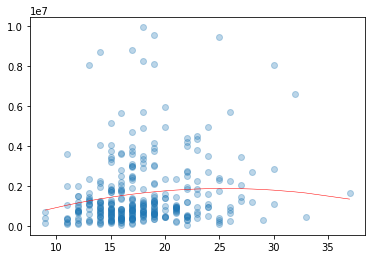

Root mean squared error - vs. Testing Data: 1691613.994207
r^2 Score vs. Testing Data: 0.026067
----------------------------------
Distance - Money
----------------------------------


------------------
Training Data
------------------



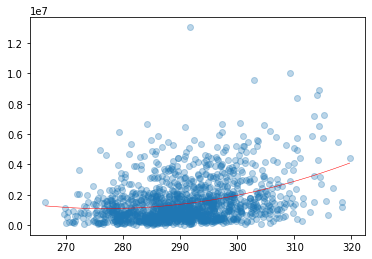

Root mean squared error - vs. Training Data: 1334770.596112
r^2 Score vs. Training Data: 0.112522


------------------
Test Data
------------------



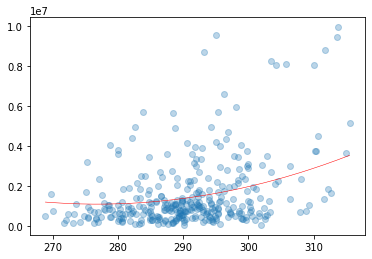

Root mean squared error - vs. Testing Data: 1574685.349561
r^2 Score vs. Testing Data: 0.156055
----------------------------------
GIRpct - Money
----------------------------------


------------------
Training Data
------------------



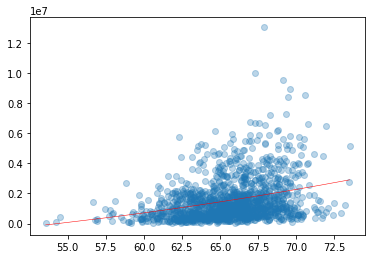

Root mean squared error - vs. Training Data: 1349530.465713
r^2 Score vs. Training Data: 0.092786


------------------
Test Data
------------------



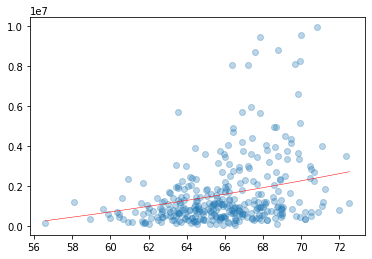

Root mean squared error - vs. Testing Data: 1617495.441059
r^2 Score vs. Testing Data: 0.109544
----------------------------------
GoodDrivepct - Money
----------------------------------


------------------
Training Data
------------------



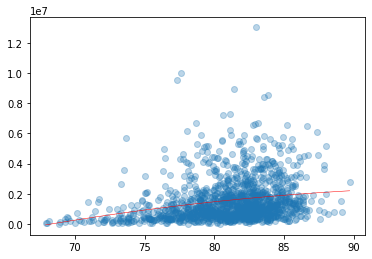

Root mean squared error - vs. Training Data: 1374048.532469
r^2 Score vs. Training Data: 0.059523


------------------
Test Data
------------------



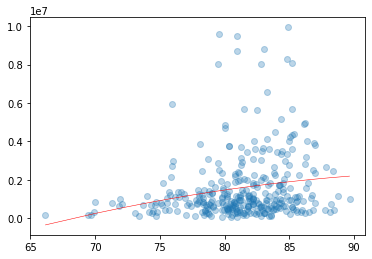

Root mean squared error - vs. Testing Data: 1677533.893060
r^2 Score vs. Testing Data: 0.042213
----------------------------------
LowestRound - Money
----------------------------------


------------------
Training Data
------------------



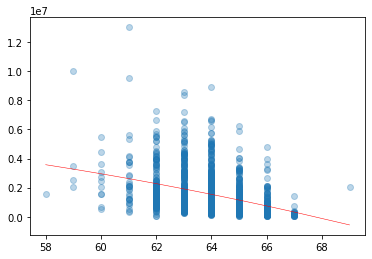

Root mean squared error - vs. Training Data: 1319412.835331
r^2 Score vs. Training Data: 0.132827


------------------
Test Data
------------------



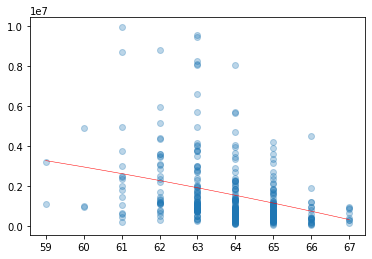

Root mean squared error - vs. Testing Data: 1603681.796784
r^2 Score vs. Testing Data: 0.124688
----------------------------------
OnePuttpct - Money
----------------------------------


------------------
Training Data
------------------



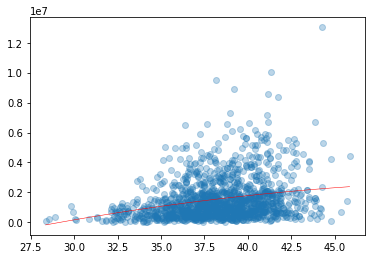

Root mean squared error - vs. Training Data: 1368367.676460
r^2 Score vs. Training Data: 0.067283


------------------
Test Data
------------------



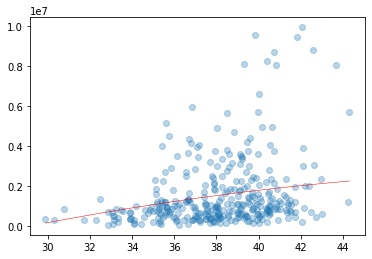

Root mean squared error - vs. Testing Data: 1648231.593708
r^2 Score vs. Testing Data: 0.075381
----------------------------------
AvgPuttsPerRound - Money
----------------------------------


------------------
Training Data
------------------



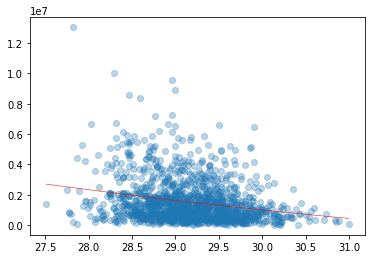

Root mean squared error - vs. Training Data: 1375769.286415
r^2 Score vs. Training Data: 0.057165


------------------
Test Data
------------------



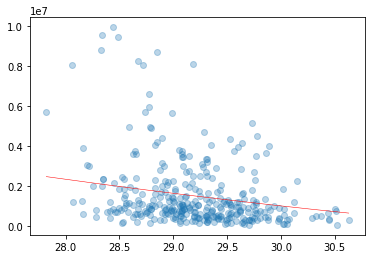

Root mean squared error - vs. Testing Data: 1642090.704641
r^2 Score vs. Testing Data: 0.082258
----------------------------------
Puttsmade10to15ft - Money
----------------------------------


------------------
Training Data
------------------



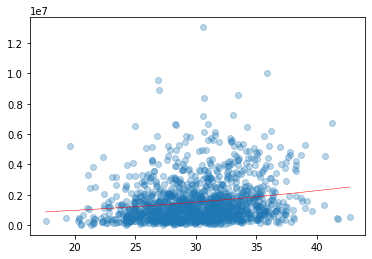

Root mean squared error - vs. Training Data: 1395327.635440
r^2 Score vs. Training Data: 0.030168


------------------
Test Data
------------------



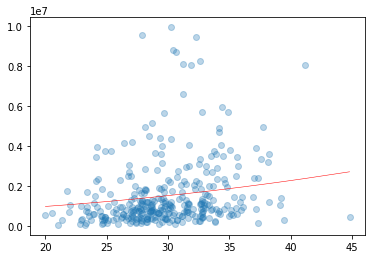

Root mean squared error - vs. Testing Data: 1673949.215716
r^2 Score vs. Testing Data: 0.046302
----------------------------------
Puttsmade15to20ft - Money
----------------------------------


------------------
Training Data
------------------



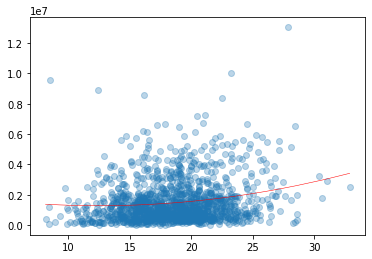

Root mean squared error - vs. Training Data: 1393520.565159
r^2 Score vs. Training Data: 0.032678


------------------
Test Data
------------------



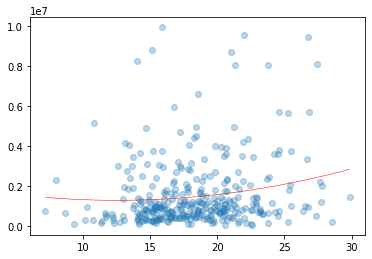

Root mean squared error - vs. Testing Data: 1685021.920480
r^2 Score vs. Testing Data: 0.033643
----------------------------------
Puttsmade20to25ft - Money
----------------------------------


------------------
Training Data
------------------



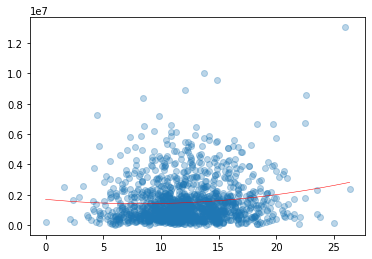

Root mean squared error - vs. Training Data: 1407483.536716
r^2 Score vs. Training Data: 0.013196


------------------
Test Data
------------------



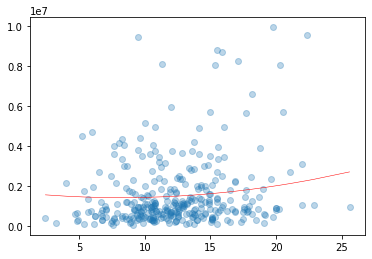

Root mean squared error - vs. Testing Data: 1687794.798466
r^2 Score vs. Testing Data: 0.030460
----------------------------------
Puttsmadeinside5ft - Money
----------------------------------


------------------
Training Data
------------------



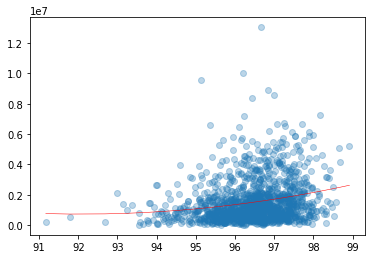

Root mean squared error - vs. Training Data: 1382096.950371
r^2 Score vs. Training Data: 0.048473


------------------
Test Data
------------------



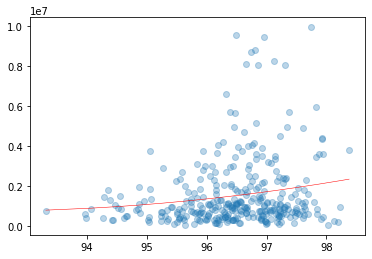

Root mean squared error - vs. Testing Data: 1684207.162340
r^2 Score vs. Testing Data: 0.034578
----------------------------------
Puttsmade5to10ft - Money
----------------------------------


------------------
Training Data
------------------



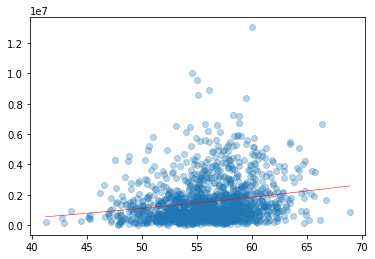

Root mean squared error - vs. Training Data: 1388786.042917
r^2 Score vs. Training Data: 0.039240


------------------
Test Data
------------------



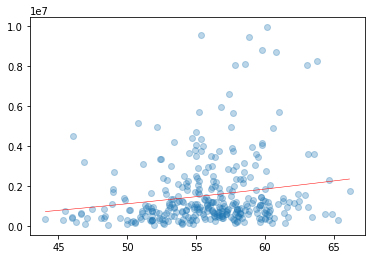

Root mean squared error - vs. Testing Data: 1680710.260967
r^2 Score vs. Testing Data: 0.038582


In [45]:
dependent_variable = 'Money'
independent_variables = player_df.columns.drop([dependent_variable, 
                                                'Player Name'])

for i in range(0,len(independent_variables)) :

    print('----------------------------------')
    print(independent_variables[i],"-",dependent_variable)
    print('----------------------------------')
    print()
    polynomial_regression(independent_variables[i],dependent_variable)

# Multivariate Polynomial Regression

In [46]:
training_data, testing_data = train_test_split(player_df, test_size = 0.2, random_state = 4)

## Defining Multivariate Polynomial Regression Function

In [47]:
def multi_polynomial_regression(X,y):
    
    X_train = np.array(training_data[X]) 
    y_train = training_data[y]
    X_test = np.array(testing_data[X])
    y_test = testing_data[y]

    poly = PolynomialFeatures(degree=2)
    X_poly = poly.fit_transform(X_train)
    
    model_multi = LinearRegression()
    model_multi.fit(X_poly, y_train)
    
    y_pred = model_multi.predict(X_poly)

    rmse = np.sqrt(mean_squared_error(y_train,y_pred))
    r2 = r2_score(y_train,y_pred)

    print('Root mean squared error - vs. Training Data: %f'% rmse)
    print('r^2 Score vs. Training Data: %f'% r2)
    print()
    
    X_poly_test = poly.fit_transform(X_test)
    y_pred_test = model_multi.predict(X_poly_test)
    
    rmse = np.sqrt(mean_squared_error(y_test,y_pred_test))
    r2 = r2_score(y_test,y_pred_test)

    print('Root mean squared error - vs. Testing Data: %f'% rmse)
    print('r^2 Score vs. Testing Data: %f'% r2)
    
    return  X_test, y_test, X_train, y_train, y_pred

## Applying Multivariate Polynomial Regression

----------------------------------
Money  - Multivariate Polynomial Regression
----------------------------------

Root mean squared error - vs. Training Data: 766101.498964
r^2 Score vs. Training Data: 0.707641

Root mean squared error - vs. Testing Data: 1070847.074374
r^2 Score vs. Testing Data: 0.609716

----------------------------------
Season - Money
----------------------------------



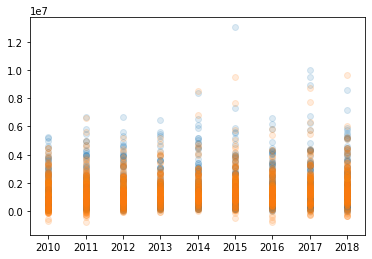

----------------------------------
ThreePuttAvg - Money
----------------------------------



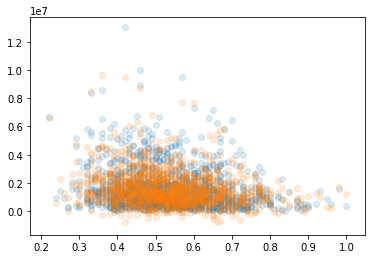

----------------------------------
AverageDistance - Money
----------------------------------



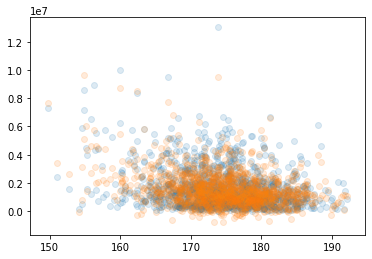

----------------------------------
ScramblingSand - Money
----------------------------------



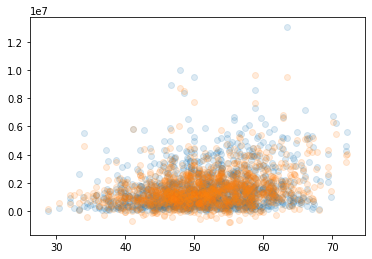

----------------------------------
ScramblingFringe - Money
----------------------------------



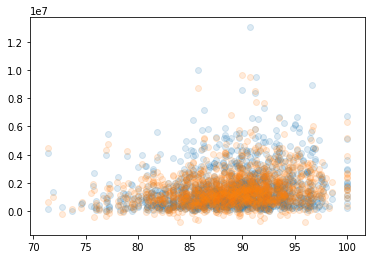

----------------------------------
ScramblingRough - Money
----------------------------------



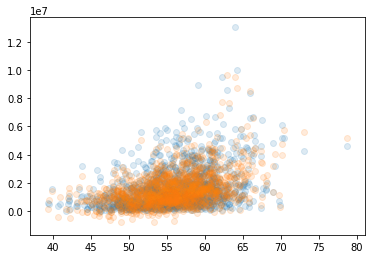

----------------------------------
DrivingAccuracy - Money
----------------------------------



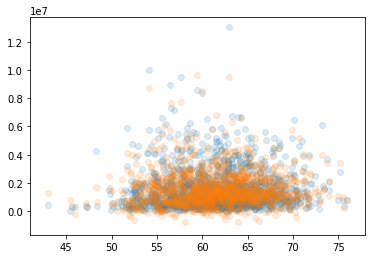

----------------------------------
BirdieConversion - Money
----------------------------------



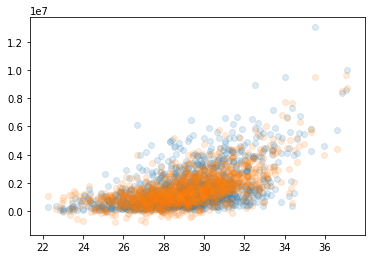

----------------------------------
ConsecutiveGIR - Money
----------------------------------



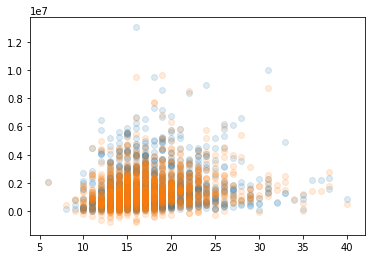

----------------------------------
Distance - Money
----------------------------------



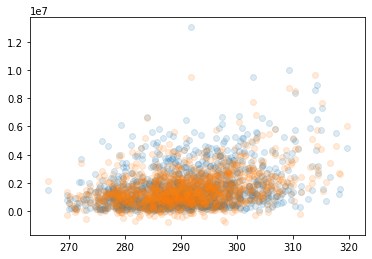

----------------------------------
GIRpct - Money
----------------------------------



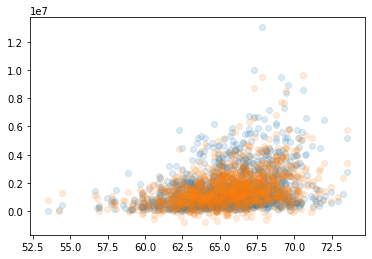

----------------------------------
GoodDrivepct - Money
----------------------------------



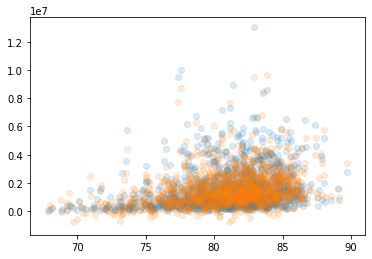

----------------------------------
LowestRound - Money
----------------------------------



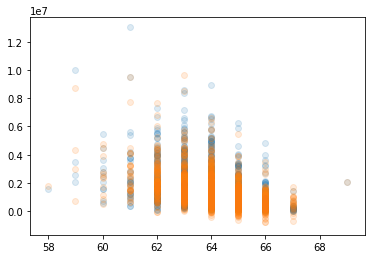

----------------------------------
OnePuttpct - Money
----------------------------------



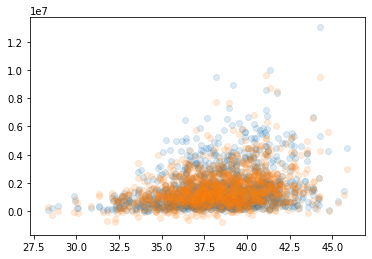

----------------------------------
AvgPuttsPerRound - Money
----------------------------------



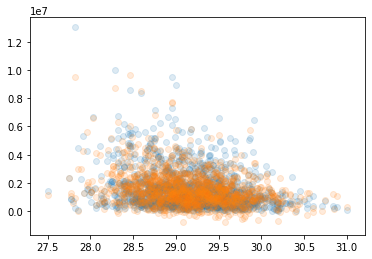

----------------------------------
Puttsmade10to15ft - Money
----------------------------------



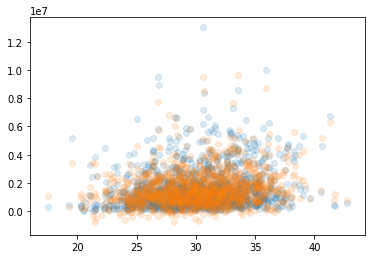

----------------------------------
Puttsmade15to20ft - Money
----------------------------------



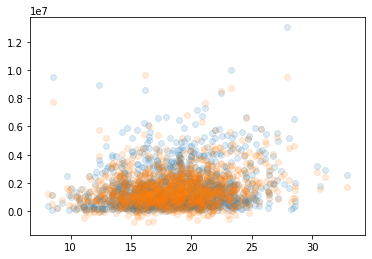

----------------------------------
Puttsmade20to25ft - Money
----------------------------------



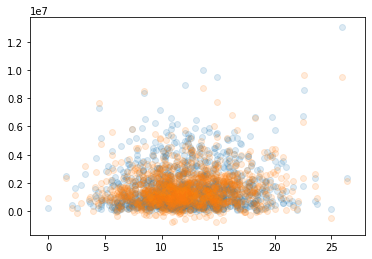

----------------------------------
Puttsmadeinside5ft - Money
----------------------------------



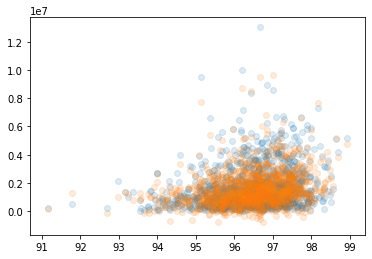

----------------------------------
Puttsmade5to10ft - Money
----------------------------------



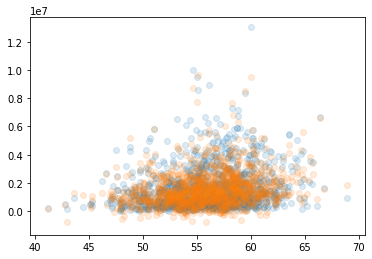

In [48]:
dependent_variable = 'Money'
independent_variables = player_df.columns.drop([dependent_variable,
                                                'Player Name'])

print('----------------------------------')
print(dependent_variable,' - Multivariate Polynomial Regression')
print('----------------------------------')
print()
multi_polynomial_regression(independent_variables,dependent_variable)
print()

X_train = np.array(training_data[independent_variables]) 
y_train = training_data[dependent_variable]
X_test = np.array(testing_data[independent_variables])
y_test = testing_data[dependent_variable]

poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X_train)

model_multi = LinearRegression()
model_multi.fit(X_poly, y_train)

y_pred = model_multi.predict(X_poly)
    
for i in range(0,len(independent_variables)) :

    print('----------------------------------')
    print(independent_variables[i],"-",dependent_variable)
    print('----------------------------------')
    print()
    plt.scatter(X_train[:,i],y_train, alpha = 0.15)
    plt.scatter(X_train[:,i],y_pred,alpha = 0.15)
    plt.show()
    

## Looking at how trends have changed over time (by Season)

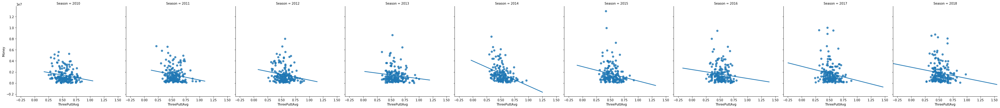

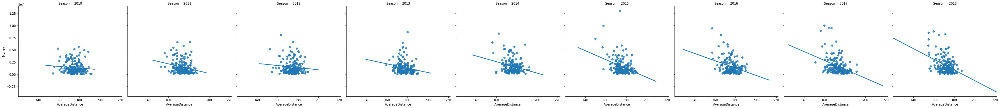

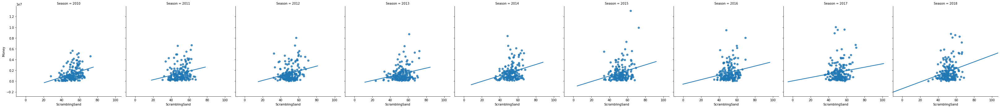

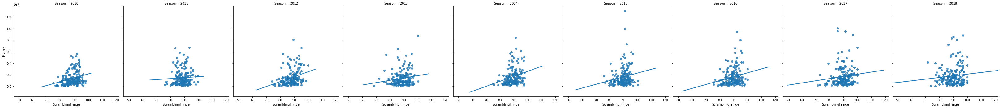

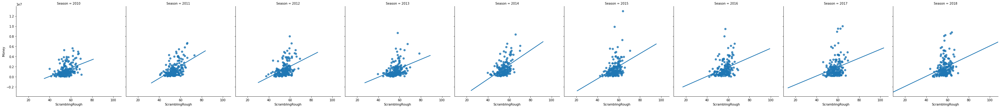

...

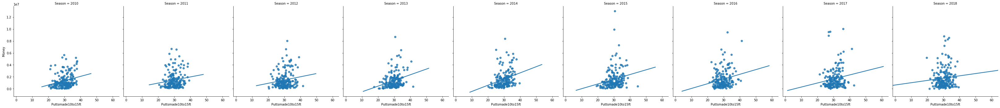

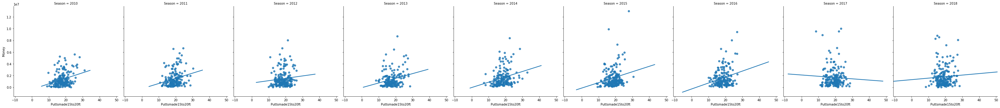

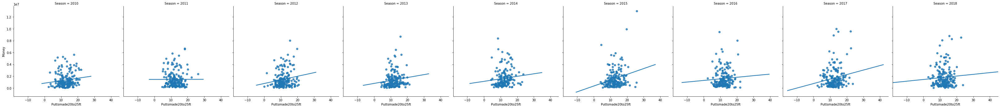

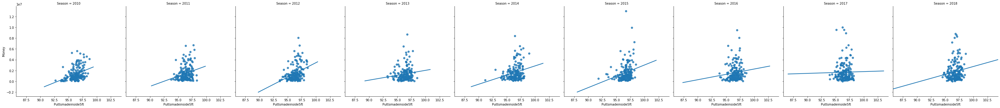

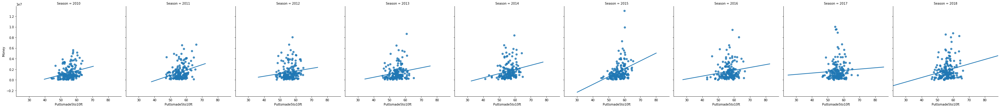

In [49]:
dependent_variable = 'Money'
independent_variables = df.columns.drop([dependent_variable, 'Player Name','Season'])

for i in range(0,len(independent_variables)):
    sns.lmplot(x=independent_variables[i], y='Money', data=df, ci=None, col='Season', order=1)

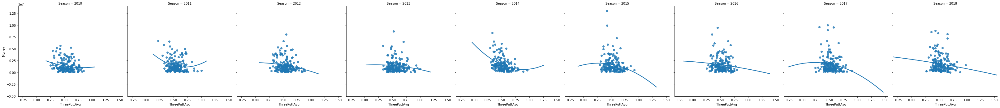

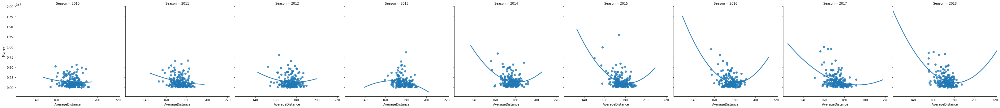

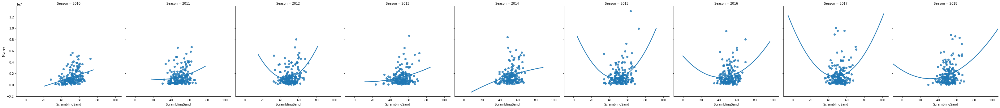

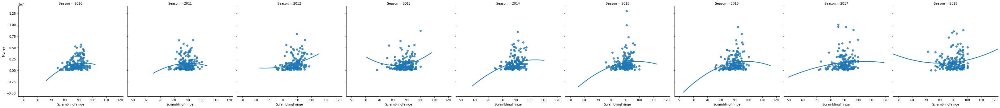

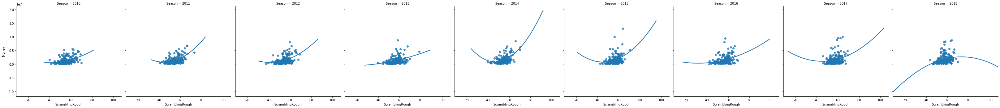

...

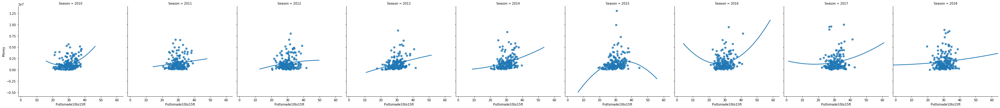

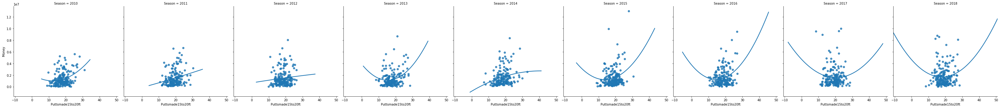

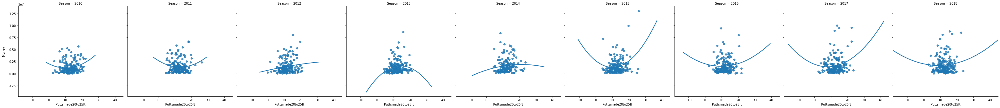

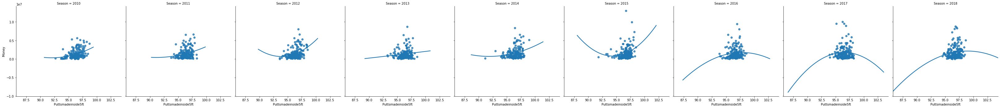

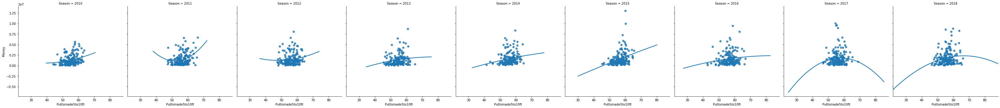

In [50]:
dependent_variable = 'Money'
independent_variables = df.columns.drop([dependent_variable, 'Player Name','Season'])

for i in range(0,len(independent_variables)):
    sns.lmplot(x=independent_variables[i], y='Money', data=df, ci=None, col='Season', order=2)

# K-Means Clustering

In [52]:
dependent_variable = 'Money'
independent_variables = player_df.columns.drop(['Player Name'])

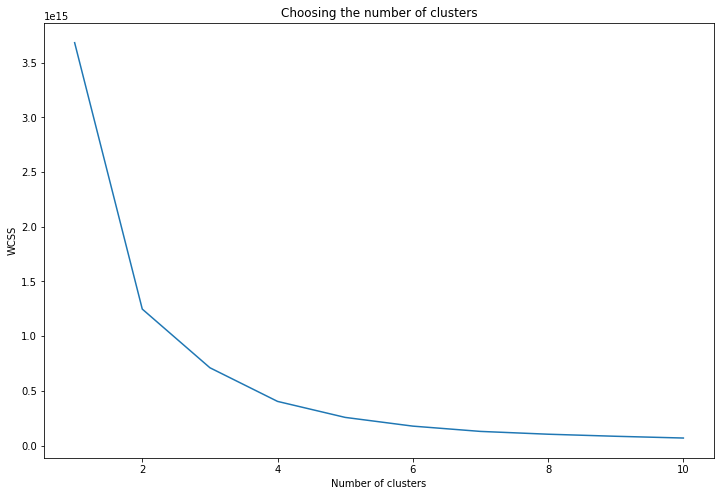

In [53]:
wcss = []
X = np.array(player_df[independent_variables])

for k in range(1,11):
    
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    pred_y = kmeans.fit_predict(X)
    wcss.append(kmeans.inertia_)
    
plt.figure(figsize=(12,8))
plt.plot(range(1, 11), wcss)
plt.title('Choosing the number of clusters')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [54]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X)

In [55]:
labels = kmeans.labels_

In [56]:
player_df['Cluster'] = labels

In [57]:
player_df[player_df['Cluster']==0].mean()

Variable
Season                  2013.827696
Money                 641308.799154
ThreePuttAvg               0.551744
AverageDistance          175.659091
ScramblingSand            50.538795
ScramblingFringe          88.270793
ScramblingRough           54.504598
DrivingAccuracy           61.204366
BirdieConversion          28.157188
ConsecutiveGIR            16.971459
Distance                 288.845772
GIRpct                    65.151871
GoodDrivepct              80.276321
LowestRound               64.312896
OnePuttpct                37.716734
AvgPuttsPerRound          29.263911
Puttsmade10to15ft         29.505370
Puttsmade15to20ft         18.120476
Puttsmade20to25ft         11.915476
Puttsmadeinside5ft        96.306184
Puttsmade5to10ft          55.335486
Cluster                    0.000000
dtype: float64

In [58]:
player_df.groupby('Cluster').count()

Variable,Player Name,Season,Money,ThreePuttAvg,AverageDistance,ScramblingSand,ScramblingFringe,ScramblingRough,DrivingAccuracy,BirdieConversion,ConsecutiveGIR,Distance,GIRpct,GoodDrivepct,LowestRound,OnePuttpct,AvgPuttsPerRound,Puttsmade10to15ft,Puttsmade15to20ft,Puttsmade20to25ft,Puttsmadeinside5ft,Puttsmade5to10ft
Cluster,,,,,,,,,,,,,,,,,,,,,,
0,946,946,946,946,946,946,946,946,946,946,946,946,946,946,946,946,946,946,946,946,946,946
1,498,498,498,498,498,498,498,498,498,498,498,498,498,498,498,498,498,498,498,498,498,498
2,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27
3,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207


In [59]:
player_df.groupby('Cluster').mean()

Variable,Season,Money,ThreePuttAvg,AverageDistance,ScramblingSand,ScramblingFringe,ScramblingRough,DrivingAccuracy,BirdieConversion,ConsecutiveGIR,Distance,GIRpct,GoodDrivepct,LowestRound,OnePuttpct,AvgPuttsPerRound,Puttsmade10to15ft,Puttsmade15to20ft,Puttsmade20to25ft,Puttsmadeinside5ft,Puttsmade5to10ft
Cluster,,,,,,,,,,,,,,,,,,,,,
0,2013.827696,6.413088e+05,0.551744,175.659091,50.538795,88.270793,54.504598,61.204366,28.157188,16.971459,288.845772,65.151871,80.276321,64.312896,37.716734,29.263911,29.505370,18.120476,11.915476,96.306184,55.335486
1,2014.253012,1.877906e+06,0.523735,173.958635,51.893976,89.532932,56.837912,61.757209,29.688574,18.255020,292.072088,65.845382,81.880783,63.590361,38.822048,29.078655,30.414137,18.864076,12.505201,96.542932,56.313996
2,2015.370370,8.024487e+06,0.477037,165.818519,58.075556,91.824074,61.472963,59.998519,33.805556,20.481481,303.437037,68.678889,82.201852,62.740741,40.522593,28.686296,31.645926,19.968148,14.877778,96.840000,57.991481
3,2014.038647,4.067161e+06,0.497874,171.775845,54.375700,90.222222,59.025411,61.946280,30.890242,18.164251,295.084541,67.155990,82.384058,63.149758,39.278744,28.969614,31.487391,19.486135,12.622415,96.833092,57.168116


''

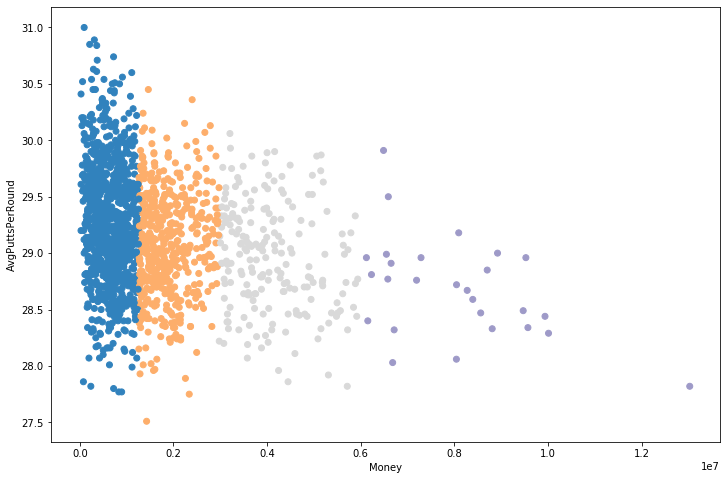

In [60]:
plt.figure(figsize=(12,8))
plt.scatter(player_df['Money'], player_df['AvgPuttsPerRound'],c=player_df['Cluster'], cmap='tab20c')
plt.xlabel('Money')
plt.ylabel('AvgPuttsPerRound')
;

''

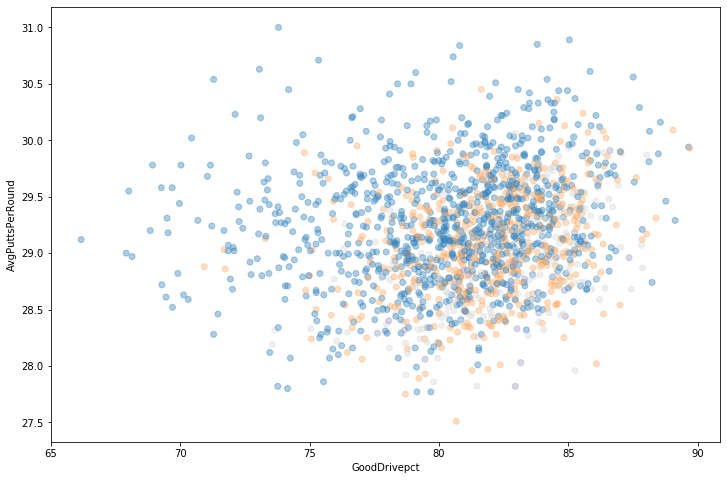

In [61]:
plt.figure(figsize=(12,8))
plt.scatter(player_df['GoodDrivepct'], player_df['AvgPuttsPerRound'],c=player_df['Cluster'], cmap='tab20c', alpha=0.4)
plt.xlabel('GoodDrivepct')
plt.ylabel('AvgPuttsPerRound')
;

In [62]:
fig = px.scatter(player_df,x='Cluster',y='Money', 
                 color = 'Cluster',hover_data =['Player Name', 'Season']
                ,color_continuous_scale='Jet')
fig.update_layout(template="plotly_white")
fig.update_xaxes(tick0=1, dtick=1)
fig.show()

In [63]:
fig = px.scatter(player_df,x='Distance',y='DrivingAccuracy', 
                 color = 'Cluster',hover_data =['Player Name', 'Season'],
                 color_continuous_scale='Jet', range_x=(260,320), range_y=(45,80))

fig.update_layout(template="plotly_white")
fig.show()

In [64]:
fig = px.scatter(player_df,x='AverageDistance',y='GIRpct'
                 , color = 'Cluster',hover_data =['Player Name', 'Season']
                ,color_continuous_scale='Jet', range_x=(150,200), range_y=(55,75))

fig.update_layout(template="plotly_white")
fig.show()

In [65]:
fig = px.scatter(player_df,x='AvgPuttsPerRound',y='GIRpct', 
                 color = 'Cluster',hover_data =['Player Name','Season'], 
                 color_continuous_scale='Jet',range_x=(27,32), range_y=(55,75))

fig.update_layout(template="plotly_white")
fig.show()

# Decision Tree Analysis

In [66]:
training_data, testing_data = train_test_split(player_df, test_size = 0.2, random_state = 4)

----------------------------------
Money  - Decision Tree Classifier
----------------------------------

Accuracy: 0.6041666666666666



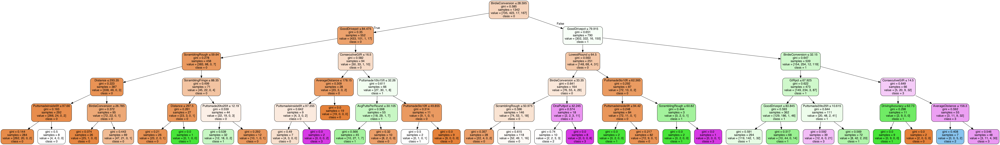

In [67]:
print('----------------------------------')
print(dependent_variable,' - Decision Tree Classifier')
print('----------------------------------')
print()

dependent_variable = 'Cluster'
independent_variables = player_df.columns.drop([dependent_variable,
                                                'Player Name', 
                                                'Money'])
X = independent_variables
y = dependent_variable
    
X_train = np.array(training_data[X]) 
y_train = training_data[y]
X_test = np.array(testing_data[X])
y_test = testing_data[y]# Define the features and labels, and the size of the testing/training set

clf = DecisionTreeClassifier(max_depth=5,criterion='gini')
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print()

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = independent_variables,class_names=['0','1','2','3'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('player_tree.png')
Image(graph.create_png())

In [68]:
player_df.groupby('Cluster').mean().sort_values(by=['Money'], ascending=False)

Variable,Season,Money,ThreePuttAvg,AverageDistance,ScramblingSand,ScramblingFringe,ScramblingRough,DrivingAccuracy,BirdieConversion,ConsecutiveGIR,Distance,GIRpct,GoodDrivepct,LowestRound,OnePuttpct,AvgPuttsPerRound,Puttsmade10to15ft,Puttsmade15to20ft,Puttsmade20to25ft,Puttsmadeinside5ft,Puttsmade5to10ft
Cluster,,,,,,,,,,,,,,,,,,,,,
2,2015.370370,8.024487e+06,0.477037,165.818519,58.075556,91.824074,61.472963,59.998519,33.805556,20.481481,303.437037,68.678889,82.201852,62.740741,40.522593,28.686296,31.645926,19.968148,14.877778,96.840000,57.991481
3,2014.038647,4.067161e+06,0.497874,171.775845,54.375700,90.222222,59.025411,61.946280,30.890242,18.164251,295.084541,67.155990,82.384058,63.149758,39.278744,28.969614,31.487391,19.486135,12.622415,96.833092,57.168116
1,2014.253012,1.877906e+06,0.523735,173.958635,51.893976,89.532932,56.837912,61.757209,29.688574,18.255020,292.072088,65.845382,81.880783,63.590361,38.822048,29.078655,30.414137,18.864076,12.505201,96.542932,56.313996
0,2013.827696,6.413088e+05,0.551744,175.659091,50.538795,88.270793,54.504598,61.204366,28.157188,16.971459,288.845772,65.151871,80.276321,64.312896,37.716734,29.263911,29.505370,18.120476,11.915476,96.306184,55.335486


In [69]:
pd.DataFrame({'feature':independent_variables, 'importance':clf.feature_importances_}).sort_values(by='importance',ascending=False)


,feature,importance
7,BirdieConversion,0.417063
11,GoodDrivepct,0.172134
8,ConsecutiveGIR,0.053510
5,ScramblingRough,0.048509
17,Puttsmade20to25ft,0.047035
12,LowestRound,0.045610
18,Puttsmadeinside5ft,0.034480
10,GIRpct,0.034391
2,AverageDistance,0.026591
19,Puttsmade5to10ft,0.023943


In [70]:
dataset_2019= pd.read_csv('./pga-tour-20102018-data/2019_data.csv')

In [71]:
dataset_2019.head()

,Player Name,Date,Statistic,Variable,Value
0,Cameron Champ,2019-08-25,Driving Distance,Driving Distance - (ROUNDS),78
1,Rory McIlroy,2019-08-25,Driving Distance,Driving Distance - (ROUNDS),72
2,Luke List,2019-08-25,Driving Distance,Driving Distance - (ROUNDS),66
3,Dustin Johnson,2019-08-25,Driving Distance,Driving Distance - (ROUNDS),73
4,Wyndham Clark,2019-08-25,Driving Distance,Driving Distance - (ROUNDS),87


In [72]:
df_2019 = dataset_2019.set_index(['Player Name', 'Variable','Date'])['Value'].unstack('Variable').reset_index()
df_2019.shape

(35885, 1498)

In [73]:
print("original column count:\t" + str(len(dataset_2019.columns)))
print("     new column count:\t" + str(len(df_2019.columns)))

original column count:	5
     new column count:	1498


In [74]:
#Narrow down to the more interesting X columns.
Keep_Columns_2019 = ['Player Name','Date','Total Money (Official and Unofficial) - (MONEY)','3-Putts per Round - (AVG)',
                'Average Distance to Hole After Tee Shot - (AVG)','Scrambling from the Sand - (%)',
                'Scrambling from the Fringe - (%)','Scrambling from the Rough - (%)','Driving Accuracy Percentage - (%)',
                'Birdie or Better Conversion Percentage - (%)','Consecutive GIR - (STREAK)'
                ,'Driving Distance - (AVG.)','Greens in Regulation Percentage - (%)','Good Drive Percentage - (%)'
                ,'Lowest Round - (VALUE)','One-Putt Percentage - (%)','Putts Per Round - (AVG)',"Putting from - 10-15' - (% MADE)",
                "Putting from - 15-20' - (% MADE)","Putting from - 20-25' - (% MADE)","Putting from Inside 5' - (%)","Putting from 5-10' - (%)"
               ]
Keep_Columns_2019

['Player Name',
 'Date',
 'Total Money (Official and Unofficial) - (MONEY)',
 '3-Putts per Round - (AVG)',
 'Average Distance to Hole After Tee Shot - (AVG)',
 'Scrambling from the Sand - (%)',
 'Scrambling from the Fringe - (%)',
 'Scrambling from the Rough - (%)',
 'Driving Accuracy Percentage - (%)',
 'Birdie or Better Conversion Percentage - (%)',
 'Consecutive GIR - (STREAK)',
 'Driving Distance - (AVG.)',
 'Greens in Regulation Percentage - (%)',
 'Good Drive Percentage - (%)',
 'Lowest Round - (VALUE)',
 'One-Putt Percentage - (%)',
 'Putts Per Round - (AVG)',
 "Putting from - 10-15' - (% MADE)",
 "Putting from - 15-20' - (% MADE)",
 "Putting from - 20-25' - (% MADE)",
 "Putting from Inside 5' - (%)",
 "Putting from 5-10' - (%)"]

In [75]:
#Drop non-numeric
df_2019=df_2019[Keep_Columns_2019].dropna()
# df_2019=df[Keep_Columns]

In [76]:
df_2019.apply(pd.to_numeric, errors='ignore');

In [77]:
#Rename the columns to something shorter
df_2019.rename(columns = {'Total Money (Official and Unofficial) - (MONEY)':'Money'}, inplace = True)
df_2019.rename(columns = {'3-Putts per Round - (AVG)':'ThreePuttAvg'}, inplace = True)
df_2019.rename(columns = {'Average Distance to Hole After Tee Shot - (AVG)':'AverageDistance'}, inplace = True)
df_2019.rename(columns = {'Scrambling from the Sand - (%)':'ScramblingSand'}, inplace = True)
df_2019.rename(columns = {'Scrambling from the Fringe - (%)':'ScramblingFringe'}, inplace=True)
df_2019.rename(columns = {'Scrambling from the Rough - (%)':'ScramblingRough'}, inplace=True)
df_2019.rename(columns = {'Driving Accuracy Percentage - (%)':'DrivingAccuracy'}, inplace=True)
df_2019.rename(columns = {'Birdie or Better Conversion Percentage - (%)':'BirdieConversion'}, inplace=True)
df_2019.rename(columns = {'Consecutive GIR - (STREAK)':'ConsecutiveGIR'}, inplace=True)
df_2019.rename(columns = {'Driving Distance - (AVG.)':'Distance'}, inplace=True)
df_2019.rename(columns = {'Greens in Regulation Percentage - (%)':'GIRpct'}, inplace=True)
df_2019.rename(columns = {'Good Drive Percentage - (%)':'GoodDrivepct'}, inplace=True)
df_2019.rename(columns = {'Hit Fairway Percentage - (%)':'HitFairwaypct'}, inplace=True)
df_2019.rename(columns = {'Lowest Round - (VALUE)':'LowestRound'}, inplace=True)
df_2019.rename(columns = {'One-Putt Percentage - (%)':'OnePuttpct'}, inplace=True)
df_2019.rename(columns = {'Putts Per Round - (AVG)':'AvgPuttsPerRound'}, inplace=True)
df_2019.rename(columns = {"Putting from Inside 5' - (%)":'Puttsmadeinside5ft'}, inplace=True)
df_2019.rename(columns = {"Putting from 5-10' - (%)":'Puttsmade5to10ft'}, inplace=True)
df_2019.rename(columns = {"Putting from - 10-15' - (% MADE)":'Puttsmade10to15ft'}, inplace=True)
df_2019.rename(columns = {"Putting from - 15-20' - (% MADE)":'Puttsmade15to20ft'}, inplace=True)
df_2019.rename(columns = {"Putting from - 20-25' - (% MADE)":'Puttsmade20to25ft'}, inplace=True)

In [78]:
df_2019.columns

Index(['Player Name', 'Date', 'Money', 'ThreePuttAvg', 'AverageDistance', 'ScramblingSand', 'ScramblingFringe', 'ScramblingRough', 'DrivingAccuracy', 'BirdieConversion', 'ConsecutiveGIR', 'Distance', 'GIRpct', 'GoodDrivepct', 'LowestRound', 'OnePuttpct', 'AvgPuttsPerRound', 'Puttsmade10to15ft', 'Puttsmade15to20ft', 'Puttsmade20to25ft', 'Puttsmadeinside5ft', 'Puttsmade5to10ft'], dtype='object', name='Variable')

In [79]:
df_2019.head(15)

Variable,Player Name,Date,Money,ThreePuttAvg,AverageDistance,ScramblingSand,ScramblingFringe,ScramblingRough,DrivingAccuracy,BirdieConversion,ConsecutiveGIR,Distance,GIRpct,GoodDrivepct,LowestRound,OnePuttpct,AvgPuttsPerRound,Puttsmade10to15ft,Puttsmade15to20ft,Puttsmade20to25ft,Puttsmadeinside5ft,Puttsmade5to10ft
31,Aaron Baddeley,2019-01-27,"$319,891",.29,171.9,55.56,100.00,67.57,64.29,30.98,19,287.4,73.41,89.29,65,39.68,28.71,46.15,13.64,18.18,95.09,51.28
32,Aaron Baddeley,2019-02-03,"$319,891",.38,171.4,60.00,100.00,63.64,60.71,30.43,19,289.4,72.22,85.71,65,39.93,28.81,48.39,18.52,16.00,95.31,47.73
33,Aaron Baddeley,2019-02-10,"$319,891",.37,172.8,53.85,100.00,66.67,61.13,28.57,19,286.7,71.93,86.04,65,38.89,29.05,44.44,16.67,15.38,94.79,47.73
34,Aaron Baddeley,2019-02-17,"$338,835",.35,175.7,55.00,100.00,66.18,60.44,29.93,19,287.1,68.84,84.11,65,40.58,28.87,43.48,18.92,13.79,94.76,50.00
35,Aaron Baddeley,2019-02-24,"$536,835",.30,175.7,59.09,100.00,67.09,60.48,29.76,19,287.0,69.34,84.88,65,39.92,28.81,43.48,18.92,13.79,94.76,50.00
36,Aaron Baddeley,2019-03-03,"$536,835",.30,175.7,59.09,100.00,67.09,60.48,29.76,19,287.0,69.34,84.88,65,39.92,28.81,43.48,18.92,13.79,94.76,50.00
37,Aaron Baddeley,2019-03-10,"$659,988",.29,178.0,72.73,100.00,63.86,59.35,30.46,19,287.1,66.67,82.22,65,41.94,28.29,39.62,17.50,14.29,95.58,56.98
38,Aaron Baddeley,2019-03-17,"$659,988",.36,178.5,69.44,100.00,62.50,59.44,30.87,19,286.7,66.16,81.56,65,42.26,28.33,38.98,18.60,13.16,95.09,57.89
40,Aaron Baddeley,2019-03-31,"$753,488",.35,178.5,69.77,100.00,63.92,59.96,31.96,19,287.4,65.92,82.01,65,43.84,28.03,38.98,18.60,13.16,95.09,57.89
41,Aaron Baddeley,2019-04-07,"$799,051",.37,178.7,68.00,100.00,63.89,59.51,32.57,19,288.3,65.45,81.68,65,44.72,27.93,38.24,18.37,14.29,95.52,57.39


In [80]:
df_2019.shape

(5672, 22)

In [81]:
#Remove $ and commas from Money
df_2019['Money']= df_2019['Money'].str.replace('$','')
df_2019['Money']= df_2019['Money'].str.replace(',','')

In [82]:
df_2019.dtypes

Variable
Player Name           object
Date                  object
Money                 object
ThreePuttAvg          object
AverageDistance       object
ScramblingSand        object
ScramblingFringe      object
ScramblingRough       object
DrivingAccuracy       object
BirdieConversion      object
ConsecutiveGIR        object
Distance              object
GIRpct                object
GoodDrivepct          object
LowestRound           object
OnePuttpct            object
AvgPuttsPerRound      object
Puttsmade10to15ft     object
Puttsmade15to20ft     object
Puttsmade20to25ft     object
Puttsmadeinside5ft    object
Puttsmade5to10ft      object
dtype: object

In [83]:
#Make all variables into numbers
for col in  df.columns[2:]:
    df_2019[col] = df_2019[col].astype(float)

In [84]:
df_2019['Date'] = df_2019['Date'].apply(pd.to_datetime, errors='ignore');

In [85]:
df_2019.dtypes

Variable
Player Name                   object
Date                  datetime64[ns]
Money                        float64
ThreePuttAvg                 float64
AverageDistance              float64
ScramblingSand               float64
ScramblingFringe             float64
ScramblingRough              float64
DrivingAccuracy              float64
BirdieConversion             float64
ConsecutiveGIR               float64
Distance                     float64
GIRpct                       float64
GoodDrivepct                 float64
LowestRound                  float64
OnePuttpct                   float64
AvgPuttsPerRound             float64
Puttsmade10to15ft            float64
Puttsmade15to20ft            float64
Puttsmade20to25ft            float64
Puttsmadeinside5ft           float64
Puttsmade5to10ft             float64
dtype: object

In [86]:
df_2019.groupby(['Player Name'], sort=False)['Date'].max()

Player Name
Aaron Baddeley      2019-08-18
Aaron Wise          2019-08-18
Abraham Ancer       2019-08-18
Adam Hadwin         2019-08-18
Adam Long           2019-08-18
                       ...    
Wes Roach           2019-08-18
Whee Kim            2019-08-18
Wyndham Clark       2019-08-18
Xander Schauffele   2019-08-18
Zach Johnson        2019-08-18
Name: Date, Length: 224, dtype: datetime64[ns]

In [87]:
idx = df_2019.groupby(['Player Name'])['Date'].transform(max) == df_2019['Date']

In [88]:
df_2019 = df_2019[idx]

In [89]:
df_2019_pred = df_2019[(df_2019['BirdieConversion']>32.15)
         &(df_2019['GoodDrivepct']>79.915)
         &(df_2019['ConsecutiveGIR']>14.5)
         &(df_2019['AverageDistance']<=156.3)]


df_2019_pred.shape

(1, 22)

In [90]:
df_2019_pred.sort_values(['Money'], axis=0, 
                 ascending=False)

Variable,Player Name,Date,Money,ThreePuttAvg,AverageDistance,ScramblingSand,ScramblingFringe,ScramblingRough,DrivingAccuracy,BirdieConversion,ConsecutiveGIR,Distance,GIRpct,GoodDrivepct,LowestRound,OnePuttpct,AvgPuttsPerRound,Puttsmade10to15ft,Puttsmade15to20ft,Puttsmade20to25ft,Puttsmadeinside5ft,Puttsmade5to10ft
5177,Cameron Champ,2019-08-18,1695748.0,0.84,154.9,30.88,94.29,45.03,55.3,32.98,20.0,317.9,69.3,81.72,62.0,36.84,29.88,32.94,16.67,10.68,94.85,58.48
